In [1]:
## Parameters specific to where your folders are and your data
parameter_file = 'params/params.yaml'
import yaml
import sys

with open(parameter_file,'r') as f:
    doc = yaml.load(f)

#p = dic2obj(**doc)

data_folder = doc['data_folder']
tissues = doc['tissues'].split(',')
sys.path.append(doc['pipeline_path'])
ref_fa = doc['ref_fa']
annotation=doc['annotation']


In [2]:
tss_annotation = doc['tss_annotation']

In [3]:

import os
import sys
import pandas as pd
import matplotlib
import seaborn as sns
import pickle
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from itertools import product
import glob
import re
from matplotlib_venn import venn2
from matplotlib import rcParams
import inspect
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sys.setrecursionlimit(3000)
%load_ext autoreload
%autoreload 2
rcParams['figure.figsize'] = 8, 6
import tqdm
### notebook specific configuration ###
from os.path import basename
#mpl.style.use('ggplot')
mpl.style.use('fivethirtyeight')
from cycler import cycler
mpl.rcParams['axes.prop_cycle'] = cycler(color='bgrcmyk')

from Modules.Homer import *

print('Number of tissues: ',len(tissues))

('Number of tissues: ', 16)


In [4]:
data_folder = '../Processed/'

In [5]:
sys.path.append('/home/isshamie/software/homebrew/parallel_functions/')
import parallel_functions as pf

In [6]:
sys.path.append('/home/isshamie/software/NGS-Pipeline')

In [9]:
genome_ann_mrna = pd.read_csv(mrna_peak,sep='\t',index_col=0)

In [10]:
genome_ann_mrna.head()

,Chr,Start,End,Strand
ID,,,,
ID=asmbl_1;Parent=gene_1_1;gene_id=gene_1_1;gene=gene_1;transcript_id=asmbl_1;cs=5,picr_0,9,11,+
ID=asmbl_2;Parent=gene_1_2;gene_id=gene_1_2;gene=SERHL;transcript_id=asmbl_2;cs=2,picr_0,175,177,+
ID=asmbl_3;Parent=gene_1_3;gene_id=gene_1_3;gene=gene_1;transcript_id=asmbl_3;cs=5,picr_0,3879,3881,+
ID=asmbl_5;Parent=gene_2;gene_id=gene_2;gene=RRP7A;transcript_id=asmbl_5;cs=2,picr_0,44541,44543,-
ID=asmbl_6;Parent=gene_2;gene_id=gene_2;gene=RRP7A;transcript_id=asmbl_6;cs=1,picr_0,45911,45913,-


In [11]:
genome_ann_exon = pd.read_csv('/data/isshamie/TSS_CHO/exon.peak',sep='\t',index_col=0)

# For each gene ID, what is the distribution of number of exon peaks found across the gene body? 
Using genome annotation for exons, but our +/- 1kb for promoters (so we'll get some exons just by that virtue

#### Load in annotated peak and filter for exons

In [9]:
cho_mstart_anno = pd.read_csv('/data/isshamie/CH_tissue_TSS/CHO/mSTART/f06_annoPeaks/merge_bg_2.anno'
                              ,sep='\t',comment='#',index_col=0)
cho_mstart_anno.fillna('',inplace=True)
cho_mstart_exon = cho_mstart_anno[cho_mstart_anno['Annotation'].str.contains('exon ')]
cho_mstart_exon.head()

,Chr,Start,End,Strand,Peak Score,Focus Ratio/Region Size,Annotation,Detailed Annotation,Distance to TSS,Nearest PromoterID,Entrez ID,Nearest Unigene,Nearest Refseq,Nearest Ensembl,Gene Name,Gene Alias,Gene Description,Gene Type
PeakID (cmd=annotatePeaks.pl f04_peaks/merge_bg_2.peak /data/genome/hamster/picr/picr.fa -gff /data/genome/hamster/picr/updated_final_sort.gff3),,,,,,,,,,,,,,,,,,
Merged-picr_160-705648-2,picr_160,705573,705723,+,45987.101562,f04_peaks/trim_CHO--mSTART-JHS823_S21_R1_001_a...,exon (ID=asmbl_25152.exon1;Parent=asmbl_25152;...,,103,ID=asmbl_25152.exon1;Parent=asmbl_25152;gene_i...,,,,,,,,
Merged-picr_8-16510895-2,picr_8,16510820,16510970,-,11816.900391,f04_peaks/trim_CHO--mSTART-JHS823_S21_R1_001_a...,exon (ID=asmbl_77563.exon1;Parent=asmbl_77563;...,,115,ID=asmbl_77563.exon1;Parent=asmbl_77563;gene_i...,,,,,,,,
Merged-picr_157-1228462-2,picr_157,1228387,1228537,-,6019.100098,f04_peaks/trim_CHO--mSTART-JHS823_S21_R1_001_a...,exon (ID=asmbl_23604.exon6;Parent=asmbl_23604;...,,-1052,ID=asmbl_23601.exon2;Parent=asmbl_23601;gene_i...,,,,,,,,
Merged-picr_19-9310549-2,picr_19,9310474,9310624,+,3773.699951,f04_peaks/trim_CHO--mSTART-JHS823_S21_R1_001_a...,exon (ID=asmbl_28590.exon1;Parent=asmbl_28590;...,,377,ID=asmbl_28591.exon1;Parent=asmbl_28591;gene_i...,,,,,,,,
Merged-picr_35-11035053-2,picr_35,11034978,11035128,-,3525.899902,f04_peaks/trim_CHO--mSTART-JHS823_S21_R1_001_a...,exon (ID=asmbl_47948.exon1;Parent=asmbl_47948;...,,-3966,ID=asmbl_47949.exon1;Parent=asmbl_47949;gene_i...,,,,,,,,


#### Load in geneCentric file example

In [10]:
gene_by_TSS = pd.read_csv('/data/isshamie/CH_tissue_TSS/CHO/mSTART/f06_annoPeaks/merge_bg_2.anno.geneCentric',index_col=0)
gene_by_TSS.dropna(axis=1,inplace=True) #Some unused columns
gene_by_TSS = gene_by_TSS[gene_by_TSS['hasPromoter']]

### Loop over tissues and types
#### Loop through each gene and add a column for number of exons found

In [87]:
def count_exons_by_TSS(f_gene_centric,f_peaks_annot,f_save=''):
    '''For each gene ID, what is the distribution of number of exon peaks found across the gene body?
    '''
    #### Load in geneCentric file
    curr_sample_anno = pd.read_csv(f_peaks_annot,sep='\t',comment='#',index_col=0)
    curr_sample_anno = curr_sample_anno.fillna('')
    curr_sample_exon = curr_sample_anno[curr_sample_anno['Annotation'].str.contains('exon ')]
    
    #### Loop through each gene and add a column for number of exons found
    gene_by_TSS = pd.read_csv(f_gene_centric,index_col=0)
    gene_by_TSS.dropna(axis=1,inplace=True) #Some unused columns
    gene_by_TSS = gene_by_TSS[gene_by_TSS['hasPromoter']]
    gene_by_TSS['Exon peaks'] = 0
    for ind,val in gene_by_TSS.iterrows():
        gene_by_TSS.set_value(ind,'Exon peaks',np.sum(curr_sample_exon['Annotation'].str.contains(ind)))

    #Save the gene_by_TSS
    gene_by_TSS.to_csv(f_gene_centric)

    #### Plot the distribution
    #Remove the top 99% exon peaks for some outliers 
    q = gene_by_TSS['Exon peaks'].quantile(0.99)
        
    #Plot the distribution of exons
    f = plt.figure()
    ax = f.add_subplot(111)
    sns.distplot(gene_by_TSS.loc[gene_by_TSS['Exon peaks']<q,'Exon peaks'],kde = False,axlabel='Number of exon peaks when gene has TSS');
    
    if not f_save == '':
        plt.savefig(f_save,bbox_inches='tight')
    plt.close()
    return gene_by_TSS

In [88]:
for curr_tissue in tissues: 
    i = '/data/isshamie/CH_tissue_TSS/' + curr_tissue    
    print curr_tissue
    curr_raw = glob.glob(i + '/*/')
    for j in curr_raw:
        curr_type = j.split('/')[-2]  
        print curr_type
        if not curr_type == 'ATAC':
            count = 1
            f_gene_centric  = j + 'f06_annoPeaks/merge_bg_2.anno.geneCentric'
            f_peaks_annot = j + 'f06_annoPeaks/merge_bg_2.anno'
            f_save = 'Results/Figures/exons_per_TSS/exon_per_TSS_%s_%s.png' % (curr_tissue,curr_type)
            if os.path.isfile(f_peaks_annot) and os.path.isfile(f_gene_centric):
                count_exons_by_TSS(f_gene_centric,f_peaks_annot,f_save)
            else:
                print 'Files not here for %s_%s' %(curr_tissue,curr_type) 
    

BloondnegSpleen
GRO
mSTART
Files not here for BloondnegSpleen_mSTART
ATAC
BMDM1hKLA1
GRO
ATAC
BMDMwt
GRO
ATAC
Brain
GRO
mSTART
ATAC
Brain7neg1
mSTART
Files not here for Brain7neg1_mSTART
FemaleReproductive
mSTART
Heart
mSTART
Intestine
mSTART
Files not here for Intestine_mSTART
Kidney
GRO
mSTART
ATAC
Liver
GRO
mSTART
ATAC
Lung
GRO
mSTART
ATAC
MiscOrgans
mSTART
Muscle
mSTART
Pancreas
mSTART
Skin
mSTART
Files not here for Skin_mSTART
Spleen
mSTART
Total
mSTART
Files not here for Total_mSTART
CHO
GRO
mSTART


In [150]:
def which_exon_peak_by_TSS(f_gene_centric,f_peaks_annot,f_save=''):
    '''For each gene ID, what is the distribution of number of exon peaks found across the gene body?
    '''
    #### Load in geneCentric file
    curr_sample_anno = pd.read_csv(f_peaks_annot,sep='\t',comment='#',index_col=0)
    curr_sample_anno = curr_sample_anno.fillna('')
    curr_sample_exon = curr_sample_anno[curr_sample_anno['Annotation'].str.contains('exon ')]
    
    #Find which exon number relative to the gene was it
    all_exon_nums = curr_sample_exon['Annotation'].apply(lambda x: re.search(r'exon(\d+);',x).group(1))
    all_exon_nums = all_exon_nums.astype(int)
    over_20 = np.sum(all_exon_nums > 20)
    plot_all_exon_nums = all_exon_nums[all_exon_nums < 20]
    plot_all_exon_nums = np.append(np.array(plot_all_exon_nums),20*np.ones([over_20,]))

    fig, ax = plt.subplots()
    sns.distplot(plot_all_exon_nums,kde=False,bins=20)#,axlabel='')
    ax.set_xlim([1,20])
    ax.set_xticks(range(1,20+1));

    fig.canvas.draw() #Fix plot 
    labels = [item.get_text() for item in ax.get_xticklabels()]
    labels[-1] = '>20'

    ax.set_xticklabels(labels);
    ax.set_title('Which exon into the genes had peaks?')
    
    if not f_save == '':
        plt.savefig(f_save,bbox_inches='tight')
    plt.close()
    return plot_all_exon_nums

In [161]:
mstart_exons = []
gro_exons = []
for curr_tissue in tissues: 
    i = '/data/isshamie/CH_tissue_TSS/' + curr_tissue    
    print curr_tissue
    curr_raw = glob.glob(i + '/*/')
    for j in curr_raw:
        curr_type = j.split('/')[-2]  
        print curr_type
        if not curr_type == 'ATAC':
            count = 1
            f_gene_centric  = j + 'f06_annoPeaks/merge_bg_2.anno.geneCentric'
            f_peaks_annot = j + 'f06_annoPeaks/merge_bg_2.anno'
            f_save = 'Results/Figures/exons_positions/exon_positions_%s_%s.png' % (curr_tissue,curr_type)
            if os.path.isfile(f_peaks_annot) and os.path.isfile(f_gene_centric):
                if curr_type == 'mSTART':
                    mstart_exons.append(which_exon_peak_by_TSS(f_gene_centric,f_peaks_annot,f_save))
                else:
                    gro_exons.append(which_exon_peak_by_TSS(f_gene_centric,f_peaks_annot,f_save))
            else:
                print 'Files not here for %s_%s' %(curr_tissue,curr_type) 
    

BloondnegSpleen
GRO
mSTART
Files not here for BloondnegSpleen_mSTART
ATAC
BMDM1hKLA1
GRO
ATAC
BMDMwt
GRO
ATAC
Brain
GRO
mSTART
ATAC
Brain7neg1
mSTART
Files not here for Brain7neg1_mSTART
FemaleReproductive
mSTART
Heart
mSTART
Intestine
mSTART
Files not here for Intestine_mSTART
Kidney
GRO
mSTART
ATAC
Liver
GRO
mSTART
ATAC
Lung
GRO
mSTART
ATAC
MiscOrgans
mSTART
Muscle
mSTART
Pancreas
mSTART
Skin
mSTART
Files not here for Skin_mSTART
Spleen
mSTART
Total
mSTART
Files not here for Total_mSTART
CHO
GRO
mSTART


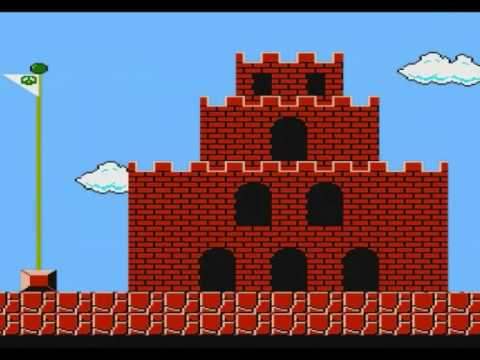

In [117]:
from IPython.display import Image
Image(filename='/home/isshamie/mario_chapter.jpg',width=600)

### Read in and plot based on Type and tissue

In [8]:
all_list = []
all_exons = pd.DataFrame()
for curr_tissue in tissues: 
    i = '/data/isshamie/CH_tissue_TSS/' + curr_tissue    
    print curr_tissue
    curr_raw = glob.glob(i + '/*/')
    for j in curr_raw:
        curr_type = j.split('/')[-2]  
        print curr_type
        if not curr_type == 'ATAC':
            count = 1
            f_gene_centric  = j + 'f06_annoPeaks/merge_bg_2.anno.geneCentric'
            f_peaks_annot = j + 'f06_annoPeaks/merge_bg_2.anno'
            f_save = 'Results/Figures/exons_per_TSS/exon_per_TSS_%s_%s.png' % (curr_tissue,curr_type)
            if os.path.isfile(f_peaks_annot) and os.path.isfile(f_gene_centric):
                all_list.append((curr_type,curr_tissue))
                curr = pd.read_csv(f_gene_centric,index_col=0)
                all_exons = all_exons.append(curr['Exon peaks'].transpose())
index = pd.MultiIndex.from_tuples(all_list, names=['type', 'tissue'])
all_exons.index = index


BloondnegSpleen
GRO
mSTART
ATAC
BMDM1hKLA1
GRO
ATAC
BMDMwt
GRO
ATAC
Brain
GRO
mSTART
ATAC
Brain7neg1
mSTART
FemaleReproductive
mSTART
Heart
mSTART
Intestine
mSTART
Kidney
GRO
mSTART
ATAC
Liver
GRO
mSTART
ATAC
Lung
GRO
mSTART
ATAC
MiscOrgans
mSTART
Muscle
mSTART
Pancreas
mSTART
Skin
mSTART
Spleen
mSTART
Total
mSTART
CHO
GRO
mSTART


GRO
mSTART


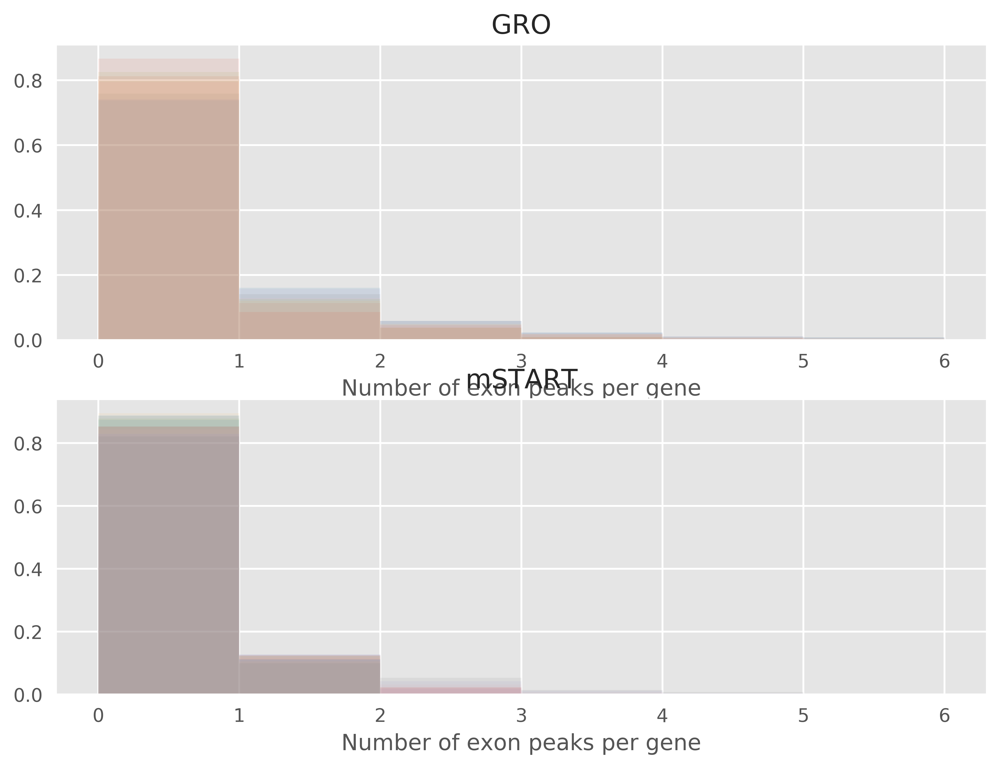

In [23]:
f = plt.figure(dpi=300)

num_types = len(set(all_exons.index.get_level_values('type')))

curr = 1
bins = np.linspace(0, 6, 7)

for ind,val in all_exons.groupby('type'):
    
    print ind
    ax = f.add_subplot(num_types,1,curr)
    for ind2,val2 in val.iterrows():
        q = np.percentile(val2.dropna(),99)
        tmp = val2.dropna()
        tmp = tmp[tmp<q]
        weights = np.ones_like(tmp)/float(len(tmp))
        
        ax.hist(tmp,weights=weights,bins=bins,alpha=0.1)
        
    ax.set_title(ind);
    ax.set_xlabel("Number of exon peaks per gene")
    curr += 1

plt.savefig('Results/Figures/exon_peak_numbers.png')
#f.close()
    

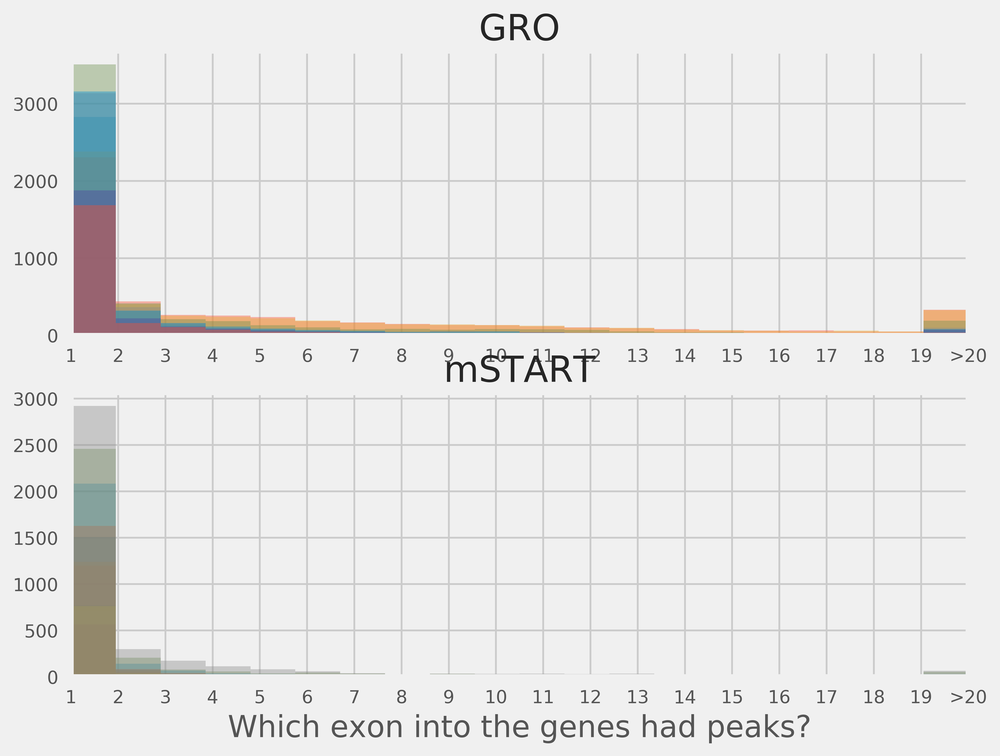

In [160]:
f = plt.figure(dpi=300)


#bins = np.linspace(0, 6, 7)    

ax = f.add_subplot(2,1,1)
for val in gro_exons:
    #ax.hist(val,weights=weights,bins=bins,alpha=0.1)
    #fig, ax = plt.subplots()
    sns.distplot(val,kde=False,bins=20)#,axlabel='')
    ax.set_xlim([1,20])
    ax.set_xticks(range(1,20+1));

    f.canvas.draw() #Fix plot 
    labels = [item.get_text() for item in ax.get_xticklabels()]
    labels[-1] = '>20'
    ax.set_xticklabels(labels);
    ax.set_title('GRO')

ax = f.add_subplot(2,1,2)
for val in mstart_exons:
    
    sns.distplot(val,kde=False,bins=20)#,axlabel='')
    ax.set_xlim([1,20])
    ax.set_xticks(range(1,20+1));

    f.canvas.draw() #Fix plot 
    labels = [item.get_text() for item in ax.get_xticklabels()]
    labels[-1] = '>20'

    ax.set_xticklabels(labels);
    ax.set_xlabel('Which exon into the genes had peaks?')    
    ax.set_title('mSTART')
plt.savefig('Results/Figures/exon_into_gene_numbers.png',bbox_inches='tight')

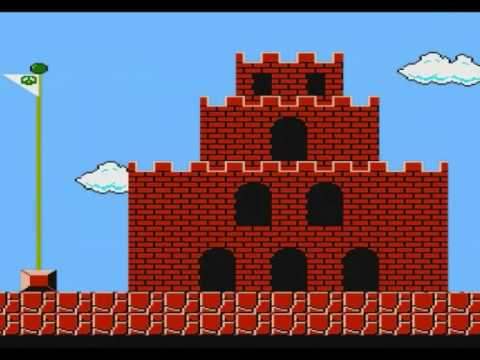

In [117]:
from IPython.display import Image
Image(filename='/home/isshamie/mario_chapter.jpg',width=600)

# Metagene plot using deepTools

In [ ]:
def run_heatmap(bed,bigwig,outfile,dist=2000,numProc=6,
                dispImage = False,computeMat_args = '',plotHeat_args = ''
               is_tss_f = ''):
    
    
    cmd = 'computeMatrix reference-point -S {bw} -R {bd} -a {d} -b {d} -out {out} --numberOfProcessors {p} {args}'.format(
        bw=bigwig, bd = tss_bed,d=dist,out=outfile,p=numProc,args=computeMat_args)
    print(cmd)
    !{cmd}   
    
    cmd = """plotHeatmap\
     -m {out}\
     -out {out}.png \
     --heatmapHeight 15  \
     --refPointLabel TSS.center \
     --regionsLabel TSS \
     --plotTitle 'ATAC signal' {args}""".format(out=outfile,args = plotHeat_args)

    print(cmd)
    !{cmd}
    
    
    if dispImage:
        return Image(filename=outfile + '.png')
    return

In [16]:
cmd = '''\
computeMatrix scale-regions -S \
../Processed/CHO/GRO/bedgraph_files/trim_CHO-5GRO-SD367_S6_R1_001.bedgraph.gz \
-R ../Processed/CHO/GRO/bed_files/merge_bg_2.anno_promoter.bed \
-out Results/gene_body_coverage/tmp --numberOfProcessors 4\
'''
cmd

'computeMatrix scale-regions -S ../Processed/CHO/GRO/bedgraph_files/trim_CHO-5GRO-SD367_S6_R1_001.bedgraph.gz -R ../Processed/CHO/GRO/bed_files/merge_bg_2.anno_promoter.bed -out Results/gene_body_coverage/tmp --numberOfProcessors 4'

### Loop through the bedgraph files and convert to bigwig using bedGraphToBigWig

In [ ]:
## Function to get into right order for deepTools

# gunzip -c {f} > {f.replace('.gz','')}
# sed -i '/type=bedGraph/d' trim_CHO-5GRO-SD367_S6_R1_001.bedgraph
# sort -k1,1 -k2,2n trim_CHO-5GRO-SD367_S6_R1_001.bedgraph -o trim_CHO-5GRO-SD367_S6_R1_001.bedgraph

# bedGraphToBigWig input /data/isshamie/genome/chrom.sizes input.replace('bedGraph','bw')
# tr ' ' \\t < trim_CHO-5GRO-SD367_S6_R1_001.bedgraph  > trim_CHO-5GRO-SD367_S6_R1_001.bedgraph_tab

## latest error is : Overlapping regions in bedGraph line 183 of trim_CHO-5GRO-SD367_S6_R1_001.bedgraph
# This is b/c some regions there may be both pos and neg (-strand )values. Probably want to pick the one with max abs value. 
# Also, since the fragments are length 1, we can just use the 2nd column and see if same, then remove the min


In [ ]:
def remove_overlap_bedgraph_regions(f_in,f_out):
    '''To convert to bigWig using bigWigToBedGraph, there is this problem where if the pos and neg values (+/- strand) overlap
    regions, it cannot convert the file. This function will remedy this by looking at the overlappinng regions
    and take the strand that has the higher absolute value (sinnce - strand is negative)
    
    Input: 
    f_in: Input uncompressed and sorted bedgraph file. Also assumes the fragment length is 1 like for TSS data
    f_out: File to save to. Will probably be the same'''
    
    
    #Load file
    df = pd.read_csv(f_in,sep='\t',header=None)
    df.columns = ['Chr','Start','End','Score']
    df['Start'] - df['Start']
    df['diff'] = df['Start'] - df['Start'].shift(-1) == 0

In [33]:
f_in = '/data/isshamie/TSS/Processed/CHO/GRO/bedgraph_files/trim_CHO-5GRO-SD367_S6_R1_001.bedgraph_tab'
df = pd.read_csv(f_in,sep='\t',header=None)#,nrows=10)

df.columns = ['Chr','Start','End','Score']
df['Start'] - df['Start']
df['diff'] = df['Start'] - df['Start'].shift(-1) == 0
df.head()

,Chr,Start,End,Score,diff
0,picr_0,2060,2061,1.51,False
1,picr_0,11919,11920,1.51,False
2,picr_0,19115,19116,-1.51,False
3,picr_0,20206,20207,-1.51,False
4,picr_0,20227,20228,1.51,False


In [56]:
inds = np.flatnonzero(df['diff'] == True)
c = np.vstack((inds,inds+1)).reshape((-1,),order='F')
df.iloc[c]

,Chr,Start,End,Score,diff
181,picr_0,20879,20880,1.51,True
182,picr_0,20879,20880,-3.01,False
284,picr_0,21023,21024,-1.51,True
285,picr_0,21023,21024,6.02,False
306,picr_0,21139,21140,-3.01,True
307,picr_0,21139,21140,3.01,False
310,picr_0,21179,21180,1.51,True
311,picr_0,21179,21180,-3.01,False
344,picr_0,21406,21407,-1.51,True
345,picr_0,21406,21407,1.51,False


In [64]:
for ind,val in df.loc[c].iterrows():

    if np.abs(df.loc[ind,'Score']) > np.abs(df.loc[ind+1,'Score']):
        print df.loc[ind,'Score']
    


6.02
-3.01
4.52
15.05
-3.01
9.03
9.03
-6.02
10.54
3.01
3.01
12.04
3.01
-3.01
4.52
10.54
-6.02
-3.01
-6.02
3.01
-12.04
-3.01
3.01
3.01
6.02
-7.53
-4.52
-15.05
-24.08
12.04
4.52
-4.52
138.49
13.55
-6.02
6.02
3.01
-3.01
15.05
13.55
-3.01
3.01
7.53
6.02
21.07
-4.52
-3.01
-3.01
-12.04
-6.02
3.01
12.04
-6.02
-3.01
-4.52
-4.52
-6.02
-3.01
4.52
-4.52
-6.02
3.01
6.02
3.01
4.52
37.63
3.01
-6.02
-3.01
-3.01
4.52
-7.53
-10.54
4.52
4.52
4.52
12.04
-3.01
-13.55
-6.02
12.04
3.01
3.01
3.01
3.01
-6.02
-121.93
3.01
-6.02
12.04
-6.02
4.52
-16.56
-6.02
13.55
-7.53
6.02
-4.52
28.6
16.56
-4.52
37.63
-4.52
-13.55
3.01
-4.52
3.01
-3.01
4.52
21.07
4.52
4.52
3.01
3.01
4.52
-3.01
4.52
6.02
-3.01
3.01
12.04
3.01
6.02
4.52
3.01
6.02
6.02
-6.02
6.02
6.02
-4.52
4.52
-7.53
9.03
3.01
-12.04
-10.54
-4.52
6.02
-9.03
3.01
-13.55
3.01
-6.02
21.07
16.56
-3.01
16.56
-3.01
13.55
9.03
-22.58
-4.52
-9.03
10.54
3.01
12.04
3.01
-7.53
3.01
-6.02
9.03
6.02
-3.01
3.01
-3.01
-4.52
-3.01
4.52
-3.01
6.02
-10.54
-7.53
-3.01
4.52
10.54


-18.07
-4.52
3.01
-6.02
4.52
-6.02
4.52
6.02
3.01
6.02
4.52
3.01
4.52
-4.52
-9.03
7.53
12.04
-3.01
3.01
-7.53
7.53
-18.07
4.52
3.01
-13.55
3.01
4.52
4.52
-3.01
4.52
3.01
3.01
4.52
-3.01
12.04
30.11
12.04
-9.03
3.01
-3.01
13.55
46.67
16.56
-3.01
7.53
7.53
7.53
3.01
4.52
-4.52
-6.02
-3.01
10.54
-4.52
-3.01
13.55
-18.07
3.01
-9.03
-3.01
-3.01
10.54
-9.03
4.52
3.01
-9.03
-9.03
9.03
-4.52
-3.01
4.52
9.03
-9.03
3.01
-3.01
3.01
-3.01
36.13
4.52
12.04
-3.01
-3.01
34.62
-4.52
-4.52
-3.01
3.01
108.38
10.54
-7.53
39.14
10.54
6.02
4.52
3.01
4.52
-4.52
72.26
46.67
-3.01
12.04
-9.03
4.52
-10.54
10.54
4.52
10.54
3.01
25.59
7.53
3.01
6.02
-3.01
10.54
12.04
7.53
19.57
6.02
3.01
7.53
4.52
3.01
7.53
6.02
-4.52
-7.53
-3.01
-3.01
3.01
-16.56
3.01
-3.01
-45.16
-19.57
12.04
-7.53
-3.01
-9.03
-10.54
-15.05
3.01
-3.01
6.02
-3.01
-3.01
3.01
6.02
-6.02
-15.05
7.53
-12.04
3.01
-4.52
-3.01
-3.01
-9.03
7.53
-6.02
9.03
3.01
-3.01
3.01
-4.52
-15.05
3.01
-4.52
-6.02
4.52
4.52
6.02
3.01
4.52
12.04
-4.52
-6.02
-6.02
18.

4.52
13.55
-3.01
-7.53
4.52
-6.02
9.03
-3.01
-3.01
-4.52
-3.01
1.51
1.51
3.01
1.51
3.01
3.01
3.01
1.51
1.51
3.01
1.51
10.54
4.52
-6.02
1.51
3.01
-58.71
36.13
7.53
3.01
6.02
7.53
-3.01
1.51
-6.02
-4.52
-7.53
-3.01
4.52
4.52
3.01
7.53
-7.53
3.01
10.54
1.51
3.01
-3.01
1.51
9.03
7.53
4.52
12.04
-3.01
69.24
-4.52
4.52
31.61
-3.01
-3.01
-3.01
-6.02
-3.01
13.55
-3.01
4.52
1.51
3.01
-3.01
4.52
7.53
-6.02
-22.58
3.01
-3.01
1.51
-4.52
15.05
1.51
1.51
12.04
7.53
3.01
-3.01
3.01
-73.76
3.01
-3.01
3.01
4.52
1.51
4.52
-9.03
4.52
-3.01
-3.01
-4.52
-3.01
-111.39
-4.52
-9.03
-16.56
7.53
-9.03
-3.01
-3.01
-3.01
-16.56
4.52
15.05
4.52
-3.01
4.52
3.01
3.01
6.02
4.52
3.01
-3.01
-19.57
6.02
3.01
7.53
-18.06
-18.06
3.01
6.02
4.52
-13.55
3.01
4.52
4.52
-4.52
3.01
3.01
6.02
-7.53
-6.02
-12.04
-3.01
-6.02
3.01
4.52
-6.02
1.51
-3.01
6.02
-4.52
4.52
15.05
-42.15
-16.56
-6.02
-7.53
-3.01
4.52
-3.01
-3.01
3.01
9.03
1.51
-39.14
1.51
-7.53
-4.52
4.52
-6.02
-19.57
-58.71
1.51
1.51
3.01
-3.01
-15.05
-3.01
-16.56
12.04


-15.05
15.05
-10.54
7.53
-45.16
7.53
1.51
4.52
4.52
-13.55
3.01
-10.54
7.53
3.01
-4.52
1.51
-3.01
4.52
-3.01
1.51
1.51
1.51
6.02
-4.52
-6.02
1.51
-6.02
3.01
3.01
3.01
4.52
4.52
-6.02
13.55
1.51
-3.01
1.51
3.01
3.01
6.02
1.51
-9.03
1.51
-3.01
-4.52
-12.04
3.01
-4.52
-9.03
7.53
28.6
-9.03
-4.52
-4.52
4.52
1.51
1.51
-9.03
1.51
3.01
3.01
-3.01
3.01
-3.01
16.56
-3.01
6.02
43.65
3.01
7.53
10.54
3.01
1.51
-3.01
-10.54
3.01
3.01
1.51
-4.51
3.01
1.51
1.51
12.04
-4.51
-13.55
-3.01
6.02
10.54
4.52
-3.01
1.51
-6.02
13.55
12.04
13.55
24.08
-7.53
-21.07
36.13
-6.02
-3.01
-19.57
-7.53
-15.05
3.01
-4.51
3.01
1.51
3.01
3.01
13.55
-3.01
-3.01
1.51
1.51
-3.01
3.01
1.51
-7.53
1.51
3.01
-3.01
-12.04
-3.01
-4.52
-13.55
1.51
7.53
3.01
3.01
-4.52
1.51
-9.03
-31.61
10.54
9.03
3.01
-27.09
-36.13
4.52
-9.03
-15.05
6.02
-15.05
-4.52
-3.01
-3.01
-6.02
1.51
1.51
1.51
3.01
-3.01
-3.01
3.01
1.51
4.52
-3.01
1.51
1.51
1.51
3.01
1.51
1.51
7.53
1.51
1.51
10.54
3.01
130.96
13.55
3.01
-7.53
1.51
3.01
1.51
6.02
-3.01
3.01
2

-10.54
-3.01
-4.52
9.03
4.52
6.02
3.01
-21.07
-3.01
3.01
3.01
-3.01
3.01
-4.52
-7.53
-4.52
-3.01
-10.54
-7.53
-7.53
7.53
-1.51
6.02
-3.01
4.52
4.52
6.02
9.03
-1.51
-4.52
3.01
4.52
4.52
-1.51
-3.01
6.02
4.52
-3.01
-1.51
-1.51
-9.03
9.03
6.02
7.53
-3.01
-4.52
-3.01
-10.54
3.01
4.52
-4.52
3.01
3.01
-40.64
-4.52
7.53
3.01
4.52
-4.52
-7.53
4.52
3.01
3.01
-27.1
6.02
6.02
3.01
3.01
-6.02
-3.01
4.52
6.02
4.52
-3.01
-16.56
3.01
-6.02
4.52
6.02
18.06
-7.53
-3.01
3.01
-6.02
3.01
31.61
6.02
10.54
10.54
-4.52
4.52
-3.01
3.01
-7.53
3.01
-9.03
-3.01
-3.01
6.02
-6.02
3.01
6.02
-49.68
4.52
-15.05
-6.02
-51.18
7.53
3.01
7.53
-49.68
6.02
-4.52
4.52
-3.01
4.52
-15.05
-3.01
7.53
-10.54
4.52
3.01
4.52
6.02
-6.02
18.06
-19.57
-3.01
13.55
-3.01
3.01
-6.02
-4.52
16.56
-4.52
3.01
16.56
58.71
28.6
16.56
-3.01
19.57
-6.02
9.03
-4.52
-10.54
-13.55
7.53
7.53
7.53
3.01
4.52
10.54
13.55
-6.02
-3.01
3.01
-10.54
-3.01
7.53
27.1
-3.01
9.03
-7.53
-30.11
-24.09
6.02
-12.04
10.54
-24.09
-9.03
-13.55
-6.02
105.37
16.56
9.03

12.04
10.54
6.02
3.01
4.52
-4.52
37.63
-9.03
-7.53
-3.01
6.02
-7.53
13.55
3.01
3.01
3.01
-4.52
-31.61
3.01
3.01
10.54
-4.52
-3.01
4.52
-19.57
4.52
15.05
-3.01
-4.52
-3.01
-4.52
-10.54
-111.39
6.02
3.01
4.52
3.01
-3.01
-4.52
9.03
36.13
-3.01
22.58
6.02
6.02
10.54
-7.53
13.55
7.53
-9.03
-3.01
-13.55
-7.53
3.01
-3.01
-4.52
3.01
-3.01
-22.58
-3.01
-4.52
-7.53
6.02
24.08
27.1
15.05
6.02
-3.01
-7.53
-4.52
3.01
-3.01
10.54
3.01
13.55
3.01
-19.57
3.01
-7.53
9.03
177.63
24.09
10.54
3.01
-9.03
-3.01
4.52
7.53
3.01
45.16
9.03
7.53
-10.54
19.57
-13.55
-15.05
-3.01
-3.01
-6.02
1.51
-3.01
3.01
-3.01
3.01
-7.53
-10.54
3.01
4.52
-15.05
-4.52
18.06
-3.01
-4.52
-12.04
-3.01
6.02
-3.01
-117.41
4.52
-3.01
30.11
3.01
7.53
4.52
-10.54
6.02
-4.52
3.01
3.01
3.01
-4.52
-10.54
-3.01
4.52
3.01
6.02
3.01
-7.53
-3.01
-3.01
22.58
-3.01
3.01
-7.53
39.14
67.74
3.01
-4.52
-9.03
-3.01
3.01
3.01
3.01
7.53
-4.52
3.01
16.56
3.01
-7.53
-22.58
4.52
-10.54
3.01
4.52
-4.52
7.53
-3.01
-16.56
4.52
-16.56
3.01
13.55
-4.52
-15.05

4.52
-24.08
3.01
-3.01
7.53
3.01
-4.52
3.01
6.02
4.52
6.02
9.03
9.03
43.65
-4.52
3.01
-4.52
-3.01
-4.52
-4.52
-3.01
16.56
12.04
-3.01
7.53
4.52
-3.01
4.52
-3.01
-4.52
13.55
12.04
-3.01
48.17
10.54
10.54
3.01
-9.03
3.01
3.01
4.52
-6.02
-4.52
-4.52
-7.53
3.01
-13.55
-3.01
4.52
-4.52
-4.52
-15.05
-13.55
12.04
-6.02
-3.01
6.02
-10.54
-4.52
27.1
3.01
-4.52
4.52
3.01
3.01
-16.56
-6.02
3.01
7.53
7.53
-6.02
6.02
-3.01
3.01
-3.01
10.54
-3.01
9.03
-4.52
3.01
-10.54
6.02
33.12
-15.05
-9.03
10.54
82.79
9.03
-13.55
-13.55
-7.53
-4.52
51.18
12.04
3.01
7.53
-10.54
6.02
3.01
-3.01
4.52
-3.01
3.01
6.02
-4.52
-4.52
4.52
3.01
-6.02
-4.52
19.57
3.01
7.53
-3.01
3.01
-82.79
3.01
-4.52
7.53
9.03
-6.02
3.01
-9.03
3.01
-3.01
-4.52
4.52
-6.02
-3.01
-4.52
3.01
-10.54
-22.58
-3.01
-4.52
3.01
16.56
4.52
9.03
-3.01
-3.01
4.52
-15.05
4.52
-16.56
-13.55
-4.52
3.01
-3.01
-3.01
-3.01
7.53
-3.01
-9.03
-24.08
4.52
-3.01
3.01
19.57
3.01
3.01
4.52
13.55
4.52
-4.52
7.53
-15.05
-9.03
-6.02
-7.53
-6.02
4.52
4.52
-3.01
48.17
-

-6.02
7.53
-4.52
4.52
3.01
4.52
4.52
4.52
-7.53
-7.53
3.01
4.52
18.06
10.54
15.05
4.52
-7.53
4.52
-3.01
6.02
-7.53
-3.01
-6.02
46.66
9.03
-3.01
4.52
4.52
3.01
-3.01
-3.01
16.56
-4.52
3.01
-3.01
10.54
-7.53
10.54
-4.52
9.03
16.56
12.04
4.52
-6.02
3.01
-3.01
-10.54
3.01
3.01
-3.01
-3.01
3.01
33.12
-3.01
-10.54
-16.56
3.01
-3.01
31.61
3.01
-9.03
12.04
-4.52
10.54
-6.02
7.53
-3.01
-4.52
6.02
4.52
-15.05
-4.52
3.01
-6.02
4.52
3.01
-16.56
4.52
-6.02
40.64
4.52
-3.01
-4.52
-3.01
3.01
3.01
9.03
4.52
-4.52
19.57
-10.54
7.53
-3.01
-18.06
-4.52
-66.23
-15.05
-42.15
-3.01
-16.56
12.04
-3.01
13.55
-69.24
-12.04
-4.52
6.02
13.55
9.03
10.54
-4.52
-3.01
-4.52
3.01
3.01
3.01
-3.01
-3.01
-4.52
13.55
4.52
3.01
-4.52
4.52
4.52
-3.01
4.52
6.02
-3.01
-3.01
-9.03
-6.02
-6.02
4.52
3.01
-1.51
12.04
3.01
-1.51
3.01
3.01
4.52
-1.51
-1.51
-3.01
-1.51
-7.53
-1.51
4.52
-3.01
18.06
-4.52
3.01
13.55
3.01
-6.02
-1.51
-12.04
3.01
-9.03
-27.1
-52.69
3.01
4.52
4.52
-1.51
-13.55
-1.51
-13.55
30.11
-4.52
3.01
12.04
-1.51
1

-4.52
-3.01
15.05
-36.13
-9.03
3.01
3.01
-7.53
4.52
15.05
73.76
3.01
3.01
-4.52
-4.52
-3.01
3.01
-3.01
3.01
12.04
-3.01
-7.53
3.01
3.01
-4.52
-4.52
-6.02
-9.03
3.01
-45.16
-36.13
-15.06
-18.07
3.01
25.59
3.01
3.01
-3.01
9.03
-12.04
3.01
-4.52
-6.02
3.01
-72.26
6.02
-25.59
3.01
-13.55
9.03
-4.52
10.54
-7.53
4.52
-4.52
-12.04
6.02
3.01
-3.01
3.01
7.53
-3.01
3.01
-3.01
9.03
-6.02
-15.06
-12.04
3.01
10.54
-9.03
-6.02
-3.01
4.52
7.53
4.52
-25.59
-3.01
-6.02
9.03
-3.01
3.01
-3.01
4.52
-3.01
-3.01
-4.52
-10.54
4.52
-4.52
10.54
-4.52
3.01
4.52
-13.55
9.03
-9.03
-6.02
22.58
-4.52
-7.53
3.01
-7.53
3.01
-13.55
-6.02
3.01
22.58
3.01
-3.01
-12.04
3.01
-3.01
-3.01
4.52
-3.01
-3.01
-3.01
4.52
4.52
22.58
4.52
-4.52
10.54
-4.52
-3.01
4.52
3.01
10.54
4.52
3.01
3.01
3.01
-6.02
-1.51
7.53
-1.51
3.01
-4.52
-3.01
-1.51
-10.54
4.52
4.52
-4.52
3.01
-3.01
-3.01
6.02
3.01
-4.52
-3.01
-9.03
-3.01
78.28
-6.02
-10.54
-4.52
3.01
3.01
3.01
-10.54
3.01
3.01
4.52
-3.01
3.01
3.01
-36.13
-3.01
3.01
-3.01
3.01
3.01
4.52


31.61
12.04
43.65
-70.75
-7.53
6.02
7.53
3.01
4.52
-4.52
-6.02
-1.51
10.54
19.57
-3.01
-4.52
-6.02
-42.15
-15.05
3.01
15.05
-4.52
4.52
15.05
-1.51
7.53
28.6
12.04
-1.51
-7.53
3.01
-4.52
4.52
4.52
-7.53
-1.51
3.01
-1.51
-3.01
-4.52
3.01
4.52
3.01
-3.01
3.01
3.01
3.01
-7.53
3.01
-1.51
-1.51
-4.52
4.52
7.53
4.52
3.01
4.52
-4.52
-3.01
-3.01
-9.03
3.01
-3.01
4.52
3.01
-4.52
-3.01
-4.52
4.52
6.02
-3.01
-3.01
-4.52
-4.52
3.01
3.01
-3.01
12.04
4.52
6.02
25.59
-3.01
-3.01
4.52
3.01
-4.52
-3.01
-3.01
7.53
-3.01
4.52
3.01
3.01
3.01
3.01
-4.52
4.52
7.53
-3.01
4.52
3.01
7.53
-16.56
4.52
6.02
-7.53
24.08
3.01
-7.53
-7.53
3.01
-4.52
6.02
-6.02
-9.03
-7.53
3.01
6.02
6.02
-3.01
13.55
42.15
3.01
6.02
3.01
-19.57
-3.01
3.01
6.02
-7.53
-4.52
6.02
-3.01
-13.55
-13.55
-10.54
4.52
6.02
4.52
-4.52
-3.01
-3.01
3.01
-40.64
12.04
6.02
-3.01
-3.01
-4.52
6.02
-3.01
-6.02
-4.52
-25.59
-7.53
-4.52
6.02
9.03
3.01
-3.01
-27.1
3.01
-21.07
3.01
-46.66
-109.89
-22.58
-6.02
-4.52
3.01
-10.54
3.01
4.52
-10.54
10.54
-4.52
-

-24.08
-3.01
3.01
-9.03
-3.01
3.01
6.02
-15.05
9.03
-78.28
21.07
-30.11
6.02
-112.9
-16.56
6.02
-18.06
3.01
9.03
9.03
4.52
10.54
13.55
-10.54
4.52
-13.55
-10.54
6.02
-3.01
88.81
3.01
3.01
-7.53
-19.57
-4.52
4.52
10.54
7.53
-3.01
-4.52
-18.06
-7.53
-9.03
-3.01
10.54
-3.01
3.01
3.01
10.54
-4.52
-3.01
-7.53
-9.03
-18.06
-12.04
-6.02
-4.52
24.08
4.52
3.01
21.07
9.03
-4.52
-3.01
3.01
-4.52
7.53
-3.01
-7.53
-4.52
6.02
-4.52
4.52
-6.02
-6.02
-24.08
12.04
6.02
-43.65
-4.52
-19.57
-3.01
-3.01
4.52
6.02
-4.52
-12.04
7.53
4.52
-3.01
-6.02
3.01
-10.54
3.01
7.53
4.52
-13.55
-28.6
-3.01
15.05
-3.01
-3.01
-12.04
3.01
-12.04
6.02
-3.01
3.01
12.04
-3.01
-3.01
-4.52
3.01
3.01
3.01
3.01
3.01
4.52
-4.52
-4.52
-3.01
-43.65
4.52
-4.52
3.01
-4.52
-6.02
-3.01
-3.01
-4.52
4.52
-3.01
4.52
3.01
6.02
-10.54
3.01
-6.02
-13.55
9.03
12.04
-3.01
3.01
-4.52
-6.02
-9.03
-6.02
7.53
-4.52
3.01
-3.01
3.01
4.52
3.01
3.01
6.02
3.01
-4.52
3.01
4.52
19.57
143.0
4.52
3.01
-7.53
3.01
-3.01
6.02
-3.01
7.53
10.54
-4.52
4.52
3.01


-10.54
4.52
10.54
6.02
-21.07
-9.03
-19.57
-10.54
3.01
-4.52
3.01
6.02
3.01
25.59
3.01
3.01
19.57
-3.01
-7.53
9.03
-4.52
1.51
-4.52
1.51
3.01
-6.02
4.52
21.07
-4.52
-6.02
4.52
12.04
-4.52
1.51
-6.02
3.01
4.52
19.57
-3.01
6.02
-7.53
-57.2
4.52
37.63
-18.06
79.78
28.6
3.01
3.01
-4.52
4.52
12.04
-6.02
3.01
146.01
3.01
4.52
4.52
3.01
3.01
3.01
-6.02
-6.02
9.03
9.03
-4.52
3.01
-10.54
3.01
-7.53
-6.02
-7.53
-85.8
-10.54
-7.53
7.53
-4.51
121.93
4.52
4.52
6.02
-4.51
-3.01
3.01
12.04
-4.51
6.02
4.52
-31.61
33.12
12.04
13.55
-3.01
16.56
4.52
21.07
4.52
3.01
4.52
4.52
3.01
7.53
4.52
-4.51
-3.01
15.05
-3.01
3.01
-4.51
3.01
-3.01
3.01
-3.01
15.05
-15.05
-3.01
-13.55
4.52
-6.02
-3.01
3.01
3.01
7.53
-3.01
3.01
-4.51
-15.05
-15.05
-4.52
1.51
-3.01
1.51
1.51
10.54
-48.17
-3.01
3.01
3.01
-3.01
1.51
7.53
-9.03
-6.02
-21.07
3.01
-4.52
13.55
4.52
-4.52
3.01
6.02
-4.52
4.52
-6.02
-10.54
1.51
4.52
-4.52
3.01
27.1
6.02
1.51
7.53
9.03
-6.02
3.01
3.01
-3.01
-10.54
4.52
12.04
-15.05
-12.04
3.01
4.52
-3.01
-33.12

-4.52
-4.52
4.52
15.05
-9.03
-3.01
3.01
-4.52
-6.02
-3.01
4.52
-4.52
-16.56
-15.05
-3.01
60.21
3.01
-4.52
-3.01
12.04
40.64
24.08
3.01
3.01
-12.04
-6.02
4.52
-4.52
3.01
3.01
6.02
4.52
-3.01
-9.03
6.02
18.06
4.52
-9.03
-3.01
-6.02
-4.52
-4.52
3.01
-24.09
-4.52
-4.52
16.56
-4.52
4.52
-3.01
3.01
-3.01
-4.52
3.01
-9.03
6.02
-4.52
13.55
3.01
3.01
3.01
4.52
7.53
15.05
-9.03
-6.02
9.03
-3.01
-3.01
-4.52
-9.03
-15.05
3.01
-10.54
3.01
-3.01
9.03
3.01
3.01
3.01
3.01
-4.52
-6.02
3.01
-6.02
6.02
-18.06
7.53
-15.05
-4.52
-7.53
3.01
9.03
-10.54
-3.01
6.02
4.52
-4.52
-6.02
-4.52
10.54
-3.01
-6.02
7.53
3.01
-4.52
3.01
-4.52
7.53
-12.04
4.52
7.53
-3.01
6.02
12.04
-3.01
6.02
-6.02
-3.01
-12.04
3.01
-4.52
-3.01
-15.05
-6.02
3.01
7.53
12.04
-4.52
-100.86
3.01
4.52
12.04
-4.52
-9.03
-49.68
-10.54
-3.01
3.01
3.01
-12.04
3.01
4.52
7.53
-4.52
-4.52
-6.02
7.53
6.02
-3.01
3.01
-4.52
3.01
-7.53
3.01
22.58
12.04
-3.01
4.52
3.01
-6.02
16.56
-10.54
-4.52
3.01
3.01
6.02
-4.52
-4.52
-6.02
-13.55
-7.53
15.05
-3.01
-16

9.03
-3.01
-4.52
6.02
10.54
-3.01
-3.01
-10.54
7.53
-39.14
-15.05
4.52
6.02
9.03
16.56
12.04
10.54
-4.52
4.52
-1.51
-7.53
6.02
13.55
-3.01
-3.01
-1.51
-1.51
-1.51
-3.01
-9.03
-4.52
-3.01
7.53
-1.51
-1.51
3.01
3.01
4.52
3.01
7.53
3.01
-3.01
-3.01
-9.03
3.01
-1.51
3.01
-3.01
3.01
-3.01
-3.01
3.01
-6.02
-1.51
-1.51
-1.51
67.74
-3.01
-15.05
-1.51
304.07
3.01
-3.01
16.56
9.03
-3.01
-1.51
6.02
10.54
-1.51
3.01
-3.01
4.52
-9.03
-4.52
-15.05
-6.02
-4.52
3.01
4.52
-10.54
-10.54
-42.15
-75.27
-45.16
-12.04
-27.1
-4.52
-3.01
-1.51
4.52
-1.51
-1.51
3.01
4.52
-4.52
3.01
-9.03
3.01
10.54
-3.01
4.52
3.01
-1.51
3.01
-1.51
-1.51
-22.58
6.02
-4.52
3.01
-1.51
-6.02
-6.02
3.01
4.52
12.04
-1.51
3.01
-1.51
6.02
4.52
-3.01
-6.02
-3.01
-1.51
19.57
-3.01
13.55
27.1
-3.01
-18.06
3.01
4.52
-4.52
-7.53
-6.02
31.61
3.01
-3.01
3.01
-3.01
3.01
7.53
-4.52
4.52
-3.01
-4.52
3.01
-4.52
-9.03
6.02
-3.01
7.53
-6.02
-7.53
-6.02
-10.54
-3.01
-4.52
-12.04
9.03
4.52
3.01
9.03
4.52
-21.07
-3.01
3.01
-4.52
3.01
-3.01
-9.03
-18.

3.01
6.02
4.52
-10.54
-9.03
-3.01
-7.53
34.62
-240.85
-15.05
3.01
-25.59
4.52
-7.53
-4.52
19.57
16.56
3.01
3.01
10.54
3.01
4.52
-4.52
3.01
4.52
15.05
-3.01
-4.52
3.01
4.52
4.52
-3.01
4.52
6.02
19.57
15.05
4.52
4.52
3.01
19.57
-3.01
-3.01
-3.01
3.01
-3.01
7.53
-3.01
-4.52
6.02
46.66
-9.03
3.01
24.09
18.06
-3.01
-7.53
3.01
-3.01
4.52
-3.01
-4.52
-13.55
4.52
-3.01
4.52
-6.02
4.52
-6.02
-6.02
-25.59
-10.54
-3.01
9.03
15.05
4.52
-3.01
7.53
4.52
-6.02
-3.01
-3.01
-3.01
10.54
3.01
4.52
-3.01
-3.01
6.02
6.02
-4.52
4.52
-4.52
-6.02
9.03
-6.02
-4.52
3.01
-10.54
9.03
4.52
-3.01
4.52
-3.01
7.53
16.56
9.03
3.01
6.02
18.06
-3.01
12.04
6.02
4.52
4.52
3.01
3.01
-3.01
4.52
10.54
4.52
-4.52
6.02
4.52
-12.04
4.52
4.52
-3.01
-6.02
-6.02
-4.52
-4.52
3.01
-3.01
-4.52
-4.52
-76.77
-24.08
3.01
6.02
16.56
4.52
18.06
4.52
-4.52
-9.03
-3.01
-3.01
-4.52
-6.02
3.01
-4.52
7.53
-19.57
6.02
-3.01
3.01
-10.54
3.01
4.52
-33.12
-25.59
-33.12
-12.04
-52.69
-10.54
4.52
4.52
-6.02
45.16
-6.02
-4.52
4.52
-7.53
-3.01
3.01
6.

4.52
-12.04
-3.01
4.52
3.01
-4.52
3.01
12.04
-3.01
-7.53
3.01
-7.53
-3.01
-4.52
139.99
102.36
-9.03
3.01
10.54
4.52
6.02
-9.03
3.01
-19.57
10.54
27.1
-4.52
-4.52
3.01
3.01
-4.52
4.52
4.52
-4.52
-7.53
-4.52
-3.01
-6.02
19.57
-34.62
13.55
4.52
-10.54
3.01
-3.01
6.02
6.02
4.52
3.01
-6.02
3.01
3.01
7.53
-3.01
-4.52
106.88
-13.55
-4.52
-42.15
6.02
-6.02
4.52
6.02
12.04
-4.52
-3.01
-4.52
7.53
4.52
-6.02
10.54
4.52
3.01
3.01
-127.95
-75.27
-19.57
-16.56
-31.61
3.01
-6.02
-4.52
-12.04
3.01
-3.01
-4.52
3.01
-7.53
-3.01
3.01
3.01
6.02
-7.53
18.06
-3.01
4.52
-3.01
4.52
-4.52
3.01
-15.05
-22.58
-16.56
3.01
-4.52
-52.69
-43.65
-9.03
-4.52
4.52
-18.06
6.02
27.1
-9.03
-13.55
4.52
-6.02
3.01
6.02
15.05
10.54
-37.63
-9.03
16.56
24.08
-4.52
3.01
-13.55
-6.02
-7.53
-7.53
-3.01
-34.62
-9.03
-10.54
-3.01
3.01
18.06
3.01
-3.01
3.01
-3.01
4.52
4.52
-3.01
13.55
21.07
-6.02
194.18
7.53
4.52
9.03
6.02
4.52
4.52
7.53
-15.05
4.52
-13.55
-6.02
4.52
-3.01
-7.53
7.53
3.01
3.01
-9.03
6.02
-10.54
-9.03
13.55
9.03
6.02

-7.53
3.01
3.01
10.54
-1.51
3.01
-1.51
-3.01
-3.01
-7.53
-1.51
-1.51
6.02
-4.52
3.01
-3.01
-3.01
-1.51
4.51
-3.01
-1.51
-1.51
3.01
-1.51
-4.52
9.03
-3.01
-3.01
3.01
-12.04
3.01
-34.62
-84.3
15.05
-3.01
4.51
-28.6
-4.52
3.01
39.14
27.09
-10.54
3.01
3.01
-4.52
-4.52
-1.51
-3.01
3.01
-4.52
-4.52
-4.52
4.51
9.03
6.02
7.53
-4.52
-6.02
3.01
-3.01
-6.02
6.02
-1.51
-3.01
-16.56
-1.51
-3.01
78.27
-7.53
-6.02
4.51
-1.51
28.6
-4.52
-1.51
-4.52
3.01
6.02
-6.02
-6.02
37.63
3.01
4.51
-4.52
6.02
-4.52
-1.51
-31.61
-13.55
6.02
-1.51
-7.53
-4.52
3.01
3.01
3.01
3.01
18.06
-1.51
-1.51
-3.01
-1.51
3.01
22.58
-1.51
-3.01
3.01
-1.51
-1.51
-1.51
-3.01
-1.51
3.01
-13.55
-6.02
-7.53
-12.04
6.02
7.52
12.04
4.51
94.83
3.01
-4.52
-6.02
-22.58
-6.02
3.01
-3.01
3.01
3.01
-48.17
4.51
-3.01
3.01
-4.52
-3.01
-4.52
-1.51
-3.01
6.02
4.51
12.04
4.51
7.53
-3.01
-3.01
6.02
-6.02
-33.12
-15.05
-144.51
-34.62
42.15
10.54
7.53
21.07
-1.51
4.51
-1.51
-3.01
4.51
12.04
-9.03
6.02
-1.51
-6.02
3.01
-1.51
-3.01
3.01
-1.51
-4.52
-1.

4.52
10.54
9.03
9.03
10.54
-1.51
-1.51
-16.56
19.57
10.54
-3.01
-1.51
-1.51
-1.51
3.01
-9.03
-1.51
-3.01
4.52
-3.01
6.02
4.52
-1.51
3.01
3.01
-4.52
3.01
-1.51
3.01
3.01
9.03
12.04
-3.01
4.52
3.01
-6.02
3.01
18.06
-4.52
-7.53
78.28
10.54
3.01
7.53
3.01
3.01
3.01
3.01
3.01
-4.52
3.01
-21.07
-3.01
-10.54
3.01
12.04
-3.01
-3.01
3.01
-9.03
-4.52
3.01
-4.52
-10.54
-10.54
-12.04
4.52
3.01
10.54
4.52
12.04
-3.01
4.52
4.52
-3.01
4.52
-12.04
3.01
4.52
3.01
-3.01
9.03
-57.2
3.01
12.04
4.52
-6.02
3.01
-6.02
9.03
3.01
4.52
9.03
-4.52
12.04
-10.54
-18.06
-6.02
-4.52
-3.01
7.53
4.52
-10.54
-15.05
6.02
9.03
10.54
-4.52
3.01
4.52
-6.02
6.02
10.54
-4.52
3.01
4.52
-6.02
3.01
-3.01
4.52
108.38
16.56
3.01
3.01
-6.02
-6.02
-4.52
4.52
60.21
12.04
-10.54
6.02
-4.52
3.01
3.01
-4.52
-3.01
6.02
7.53
-13.55
6.02
4.52
-3.01
-3.01
-3.01
-3.01
-9.03
-10.54
3.01
13.55
3.01
34.62
-13.55
3.01
4.52
3.01
-3.01
-3.01
-3.01
10.54
3.01
-4.52
-7.53
-21.07
-4.52
-3.01
-76.77
-6.02
-3.01
10.54
3.01
12.04
6.02
-21.07
6.02
6.02


4.52
88.81
3.01
-3.01
-4.52
-4.52
24.08
-4.52
-6.02
-18.06
-6.02
6.02
10.54
12.04
6.02
3.01
6.02
-9.03
-13.55
7.53
13.55
-3.01
16.56
-4.52
6.02
9.03
-16.56
21.07
3.01
-15.05
-4.52
-4.52
21.07
4.52
45.16
-9.03
-4.52
-3.01
-3.01
-3.01
10.54
-3.01
-6.02
-12.04
-3.01
-3.01
10.54
-4.52
-6.02
4.52
-3.01
-3.01
3.01
3.01
9.03
13.55
-3.01
-30.11
-3.01
-4.52
-19.57
15.05
22.58
3.01
3.01
-4.52
3.01
-6.02
-52.69
-7.53
-21.07
3.01
-10.54
9.03
-12.04
-3.01
-4.52
6.02
-3.01
6.02
-3.01
4.52
-7.53
-3.01
6.02
6.02
-3.01
3.01
4.52
4.52
54.19
-18.06
18.06
-6.02
-21.07
3.01
3.01
3.01
3.01
-3.01
-3.01
15.05
-3.01
-6.02
3.01
-3.01
21.07
-4.52
-4.52
-10.54
-7.53
3.01
3.01
-3.01
-3.01
-10.54
19.57
-3.01
-3.01
340.2
6.02
-4.52
-3.01
4.52
-3.01
-3.01
-3.01
6.02
12.04
3.01
-3.01
27.1
4.52
-10.54
6.02
10.54
10.54
-6.02
-3.01
-18.06
7.53
7.53
4.52
18.06
-3.01
-7.53
3.01
-3.01
-3.01
-7.53
7.53
-13.55
3.01
4.52
4.52
12.04
-3.01
3.01
-9.03
7.53
-4.52
-7.53
21.07
15.05
-4.52
-3.01
-3.01
7.53
3.01
-3.01
7.53
-9.03
-7.53

-3.01
-4.52
6.02
3.01
6.02
-3.01
3.01
10.54
-3.01
4.52
3.01
-4.52
-3.01
-3.01
-13.55
-3.01
-13.55
18.06
3.01
-3.01
3.01
3.01
3.01
3.01
34.62
-7.53
73.76
19.57
4.52
25.59
-3.01
3.01
13.55
7.53
-4.52
3.01
24.08
-3.01
-6.02
7.53
4.52
10.54
-3.01
-10.54
-3.01
7.53
3.01
-4.52
6.02
3.01
-4.52
-6.02
3.01
3.01
-3.01
10.54
4.52
-3.01
4.52
3.01
3.01
-7.53
-3.01
-13.55
-6.02
-9.03
10.54
-3.01
3.01
3.01
-3.01
15.05
-4.52
-3.01
-3.01
-4.52
-9.03
13.55
10.54
4.52
-3.01
-3.01
4.52
6.02
9.03
-4.52
-7.53
-3.01
-3.01
3.01
12.04
-31.61
-10.54
69.24
3.01
13.55
-7.53
25.59
16.56
-3.01
4.52
3.01
-3.01
3.01
3.01
13.55
-7.53
-7.53
-3.01
3.01
-4.52
4.52
-10.54
4.52
7.53
3.01
-6.02
-3.01
-4.52
-3.01
-3.01
-15.05
-18.06
-6.02
39.14
3.01
3.01
-3.01
3.01
-3.01
3.01
3.01
-7.53
3.01
-4.52
-4.52
3.01
-6.02
-3.01
-4.52
3.01
4.52
55.7
-3.01
3.01
3.01
-10.54
-3.01
21.07
12.04
7.53
15.05
28.6
7.53
-3.01
-3.01
3.01
-4.52
10.54
10.54
-3.01
-6.02
9.03
4.52
3.01
-19.57
10.54
-10.54
3.01
4.52
4.52
7.53
6.02
3.01
7.53
3.01
4.5

-4.52
7.53
7.53
7.53
6.02
3.01
-7.53
3.01
-3.01
7.53
3.01
-9.03
-9.03
-10.54
-15.05
-7.53
13.55
-7.53
4.52
6.02
3.01
4.52
3.01
-4.52
-4.52
6.02
-4.52
3.01
3.01
3.01
-4.52
7.53
-3.01
-12.04
4.52
-9.03
-3.01
4.52
-19.57
3.01
-12.04
1.51
3.01
1.51
-3.01
1.51
10.54
1.51
12.04
-4.52
4.52
-3.01
4.52
3.01
-4.52
4.52
-3.01
21.07
9.03
3.01
4.52
7.53
-3.01
-9.03
3.01
-12.04
-6.02
-3.01
-9.03
9.03
-7.53
-15.05
3.01
-28.6
6.02
-4.52
-6.02
3.01
4.52
-12.04
3.01
-24.08
-3.01
3.01
21.07
-6.02
-73.76
1.51
3.01
-25.59
3.01
1.51
9.03
12.04
-12.04
-4.52
4.52
6.02
-7.53
-3.01
1.51
-9.03
6.02
-7.53
-3.01
3.01
-13.55
3.01
9.03
15.05
6.02
3.01
7.53
7.53
7.53
93.33
3.01
-9.03
-3.01
1.51
1.51
7.53
-6.02
4.52
7.53
7.53
1.51
-3.01
1.51
1.51
-3.01
3.01
3.01
-9.03
-3.01
-22.58
7.53
-6.02
-6.02
13.55
-7.53
-12.04
-40.64
-7.53
-6.02
73.76
-7.53
-31.61
-3.01
-9.03
1.51
10.54
1.51
3.01
-3.01
-10.54
6.02
3.01
-6.02
-15.05
-6.02
1.51
-3.01
-4.52
1.51
-4.52
-3.01
-4.52
-3.01
10.54
3.01
10.54
-3.01
-7.53
9.03
-7.53
3.01
3

-6.02
-1.51
-1.51
3.01
10.54
-3.01
4.51
-1.51
25.59
-1.51
-1.51
-6.02
-4.52
-3.01
-6.02
-7.53
-3.01
4.51
-4.52
-7.53
-15.05
4.51
-3.01
19.57
-1.51
3.01
-1.51
-1.51
3.01
3.01
6.02
6.02
10.54
34.62
4.52
7.53
15.05
4.52
4.52
7.53
-3.01
9.03
-10.54
-28.6
-7.53
3.01
-454.6
-13.55
-3.01
-9.03
-19.57
-7.53
3.01
3.01
3.01
4.52
3.01
-3.01
-6.02
13.55
3.01
-3.01
-3.01
-13.55
57.2
-7.53
49.67
4.52
-4.52
12.04
13.55
88.81
-3.01
6.02
3.01
-12.04
-6.02
3.01
9.03
-3.01
6.02
-12.04
-3.01
4.52
4.52
-6.02
6.02
13.55
3.01
13.55
-4.52
-7.53
-9.03
12.04
4.52
3.01
-9.03
12.04
-4.52
3.01
3.01
25.59
3.01
58.71
4.52
19.57
3.01
15.05
3.01
4.52
3.01
-4.52
-3.01
4.52
-4.52
3.01
-3.01
3.01
4.52
3.01
-3.01
7.53
7.53
4.52
-6.02
10.54
7.53
4.52
4.52
-7.53
-27.1
-3.01
4.52
15.05
-7.53
4.52
-4.52
-3.01
3.01
-3.01
3.01
6.02
6.02
-3.01
-3.01
3.01
3.01
4.52
-6.02
-3.01
-36.13
-12.04
25.59
15.05
-7.53
-4.52
-16.56
-6.02
-10.54
4.52
4.52
-13.55
-4.52
12.04
4.52
-21.07
9.03
-3.01
-4.52
4.52
4.52
3.01
3.01
-18.06
-10.54
3.01


-4.52
-4.52
-6.02
-24.08
3.01
-3.01
4.52
3.01
-6.02
27.1
-4.52
4.52
3.01
-4.52
4.52
-7.53
-4.52
-6.02
-21.07
-3.01
3.01
3.01
4.52
-6.02
3.01
-3.01
3.01
-6.02
-4.52
3.01
-4.52
-4.52
4.52
-10.54
3.01
6.02
4.52
-7.53
-7.53
-7.53
-7.53
-4.52
4.52
3.01
-3.01
-6.02
7.53
-10.54
-9.03
22.58
9.03
9.03
-4.52
4.52
3.01
3.01
3.01
-42.15
-94.83
-6.02
-9.03
4.52
16.56
4.52
13.55
6.02
3.01
4.52
4.52
3.01
3.01
3.01
-3.01
7.53
-4.52
-3.01
19.57
-3.01
3.01
16.56
-6.02
1.51
-7.53
3.01
9.03
-4.52
6.02
4.52
-4.52
1.51
1.51
-12.04
9.03
46.66
34.62
-3.01
16.56
-7.53
4.52
-7.53
6.02
1.51
6.02
-18.06
4.52
-10.54
-4.52
37.63
-10.54
1.51
6.02
1.51
-4.52
3.01
4.52
1.51
9.03
-3.01
-3.01
3.01
1.51
4.52
3.01
-19.57
96.34
1.51
1.51
-4.52
7.53
4.52
3.01
9.03
-4.52
3.01
-6.02
-40.64
-13.55
30.11
3.01
4.52
-22.58
-3.01
3.01
-3.01
1.51
1.51
-36.13
-22.58
-9.03
-30.11
3.01
3.01
1.51
4.52
15.05
-4.52
3.01
4.52
64.73
-4.52
9.03
3.01
3.01
1.51
1.51
6.02
3.01
1.51
1.51
-9.03
-40.64
1.51
-4.52
1.51
-3.01
6.02
1.51
3.01
-7.53
9

10.54
-3.01
3.01
-3.01
-3.01
-15.05
55.7
4.52
9.03
7.53
-18.06
3.01
76.77
21.07
48.17
4.52
4.52
4.52
7.53
-4.52
3.01
-4.52
4.52
-3.01
3.01
-3.01
-6.02
-7.53
21.07
4.52
-3.01
-18.06
3.01
3.01
6.02
7.53
3.01
4.52
3.01
-6.02
-7.53
-3.01
9.03
-7.53
-7.53
3.01
-3.01
-27.1
3.01
-4.52
16.56
-4.52
15.05
18.06
3.01
3.01
-4.52
3.01
-3.01
9.03
-4.52
-3.01
3.01
7.53
4.52
-3.01
-4.52
3.01
-3.01
-6.02
22.58
24.08
6.02
-10.54
-3.01
3.01
-3.01
-18.06
3.01
7.53
-6.02
-10.54
4.52
3.01
7.53
3.01
4.52
4.52
4.52
3.01
-3.01
-4.52
-6.02
3.01
-7.53
3.01
16.56
19.57
-6.02
3.01
-4.52
10.54
58.71
4.52
6.02
6.02
-4.52
3.01
4.52
-4.52
3.01
-6.02
-4.52
-3.01
-7.53
4.52
3.01
4.52
-4.52
-9.03
-3.01
12.04
3.01
-16.56
-4.52
3.01
-7.53
4.52
-4.52
3.01
-7.53
-3.01
-9.03
-7.53
3.01
6.02
-4.52
-7.53
4.52
-12.04
3.01
-24.08
4.52
7.53
-9.03
4.52
-7.53
-15.05
-12.04
3.01
-30.11
3.01
4.52
-4.52
-3.01
-3.01
3.01
-3.01
-3.01
3.01
-3.01
3.01
4.52
3.01
-6.02
4.52
-4.52
-7.53
10.54
4.52
15.05
10.54
-3.01
13.55
-4.52
9.03
4.52
7.53


In [23]:
seq = ['GRO','mSTART']
for t in tissues:
    for s in seq:
        curr = glob.glob(os.path.join(data_folder,t,s,'bedgraph_files/*'))

        if not curr == []:
            for f in curr:
                cmd = 'bedGraphToBigWig '
            print(curr)

['../Processed/BMDMwt/GRO/bedgraph_files/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.bedgraph.gz', '../Processed/BMDMwt/GRO/bedgraph_files/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.bedgraph.gz']
['../Processed/Brain/GRO/bedgraph_files/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.bedgraph.gz', '../Processed/Brain/GRO/bedgraph_files/trim_CHBrain_5GRO_JHS1036_SD_ATGTCA_S51_L003_R1_001.bedgraph.gz']
['../Processed/Brain/mSTART/bedgraph_files/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.bedgraph.gz', '../Processed/Brain/mSTART/bedgraph_files/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.bedgraph.gz', '../Processed/Brain/mSTART/bedgraph_files/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.bedgraph.gz']
['../Processed/Heart/mSTART/bedgraph_files/trim_CHHeart_mSTART_JHS1013_SD_AGTTCC_S25_L002_R1_001.bedgraph.gz', '../Processed/Heart/mSTART/bedgraph_files/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.bedgraph.gz', '../Processed/Hear

computeMatrix reference-point -S ../Processed/CHO/ATAC/homer_output/CHO-ATAC-SD378_S17_R1_001.bw -R Results/tss_final/tss_peakCenter.bed -a 250 -b 250 -out Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO --numberOfProcessors 6
Skipping IGHV3-74;gene_7002;asmbl_20945;Lung_mSTART;cs=4, due to being absent in the computeMatrix output.
plotHeatmap -m Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO -out Results/ATAC_results/Homer_matrix_TSS_ATAC_CHO.png  --refPointLabel TSS.center  --regionsLabel TSS  --plotTitle 'ATAC signal'
/home/isshamie/software/anaconda2/lib/python2.7/site-packages/deeptools/heatmapper.py:1193: RuntimeWarning:


# Metagene with Homer 

In [8]:
save_dir = 'Results/metaGene'
org = 'ch'
gene_set = '/data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv'


In [163]:
def run_metaGene(t,save_dir,org,gene_set,annotation,data_folder,other_args = []):

    for t in tissues:    
        #(save_dir,org,gene_set,annotation,data_folder) = (f_args)

        out_dir = os.path.join(save_dir, t)
        if not os.path.exists(out_dir):
            os.mkdir(out_dir)
        for s in ['GRO', 'mSTART']:
            curr = (os.path.join(data_folder, t, s,'f03_tags'))
            for f in glob.glob(curr + '/*'):
                in_file = f

                out_file = os.path.join(out_dir, os.path.basename(f).replace('trim_','').partition('_SD')[0])

                cmd = 'makeMetaGeneProfile.pl %s %s -gff3 %s -d %s -min 200' % (
                    gene_set, org, annotation, in_file)                    
                
                for ar in other_args:
                    cmd = cmd + ' ' + ar 
                    
                cmd = '%s > %s' % (cmd,out_file)
                print(cmd)
                !{cmd}

    return 

In [164]:
pf.parallel_ar(np.array(tissues),run_metaGene,
               func_args=(save_dir,org,gene_set,annotation,data_folder,['-pc 3']),num_processes=8)

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/BMDMwt/CHBMDMwt_GRO_JHS1026
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/BMDMwt/CHBMDMwt_GRO_JHS1026
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/BMDMwt/CHBMDMwt_GRO_JHS1026
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 c

	Resizing peaks...
	Reading Positions...

	Peak file = 0.00285075705415139.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/He

	50000
	40000
	50000
	50000


	Peak file = 0.410908865583227.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	40000


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak file = 0.15897429113193.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to

	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq : 1.76998042209609

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS1026_SD_ATTCCT_S41_L003_R1_001.fastq : 1.76998042209609
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_GRO_JHS


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!



	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates:

	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq : 2.72197937787589

	Peak file = 0.957798478500084.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.213106169206188.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of region

	10000
	10000
	20000
	20000
	20000
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq
	20000
	10000
	20000
	20000
	30000
	30000
	30000
	10000
	30000
	20000
	30000
	30000
	40000
	40000
	40000
	20000
	40000
	30000
	40000
	40000
	50000
	50000
	50000


	Peak file = 0.201015588435443.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	30000


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak file = 0.49516097067772.2.tmp
	Genome = ch
	O

	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	50000
	10000

	10000
	10000
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq
	Reading Positions...
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq

	Peak file = 0.56152233325793.2.tmp
	Genome = ch
	Organism = null
	Peak 

	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq : 2.72197937787589
	40000
	Resizing peaks...
	Resizing peaks...
	Resizing peaks...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq : 2.72197937787589
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq : 2.72197937787589
	30000
	Reading Positions...
	Reading Positions...
	Reading Positions...
	50000
	Processing tags from ../Processed/BMDMwt/GRO/f03_tags/trim_CHBMDMwt_5GRO_JHS1033_SD_TAGCTT_S48_L003_R1_001.fastq

	-----------------------
	Compiling per bp H

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 

	50000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coord


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...

	Peak file = 0.0675938798385722.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	----------------------------------------------------

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/GRO/f03_tags/trim_CHBrain_5GRO_JHS1036_SD_ATGTCA_S51_L003_R1_001.fastq : 1.24538827727292
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/GRO/f03_tags/trim_CHBrain_5GRO_JHS1036_SD_ATGTCA_S51_L003_R1_001.fastq : 1.24538827727292

	Resizing peaks...

	Peak file = 0.669384629306482.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/GRO/f03_tags/trim_CHBrain_5GRO_JHS1036_SD_ATGTCA_S51_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Reading Positions...
	Peak/BED fi

	Resizing peaks...
	50000
	Resizing peaks...
	Resizing peaks...
	30000


	Peak file = 0.209406726601632.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/GRO/f03_tags/trim_CHBrain_5GRO_JHS1036_SD_ATGTCA_S51_L003_R1_001.fastq
	Maximum count per bp will be set to 3

	50000

	Peak file = 0.211378309483738.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/GRO/f03_tags/trim_CHBrain_5GRO

	10000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Brain/CHBrain_GRO_JHS1029
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:



	Peak file = 0.721770038203434.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.844614900955097.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq : 1.26443131808348
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)


	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq : 1.26443131808348
	Resizing peaks...


	Peak file = 0.494893855488957.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gf

	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...


	Peak file = 0.721770038203434.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Reading Positions...
	Peak/BED file conversion summary:
		BE

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq : 1.26443131808348
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_SD_CACCGG_S44_L003_R1_001.fastq : 1.26443131808348
	Processing tags from ../Processed/Brain/GRO/f03_tags/trim_CHBrain_GRO_JHS1029_S


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq : 2.11145590521578
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mS

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq : 2.11145590521578
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq : 2.11145590521578
	Reading Positions...

	Peak file = 0.468381861298443.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq
	Maximum count per bp will be



	Peak file = 0.292137065277533.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	30000
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Resizing peaks...
	40000
	50000
	10000
	Reading Positions..



	Peak file = 0.292137065277533.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.562520508960919.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq
	Maximum count per bp will b

	10000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq : 2.11145590521578

	Peak file = 0.468381861298443.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1016_SD_GTAGAG_S28_L002_R1_001.fastq
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak ID


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Resizing peaks...
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Brain/CHBrain_mSTARTinput_JHS1078
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be e

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq : 2.01694336260707

	Peak file = 0.935737607375817.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /dat

	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000

	40000
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq
	40000
	Resizing peaks

	10000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq : 2.0169

	30000
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	10000
	Processing tags from .


	Peak file = 0.291933100744249.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	Maximum count per bp will be set to 3
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Brain/CHBrain_mSTART_JHS1057
	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misfo


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		R

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq : 2.01694336260707
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTARTinput_JHS1078_SD_ATTCCT_S100_L005_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000
	20000
	30000
	40000
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq : 0.221609268005207
	Reading Positions...
	50000


	Peak file = 0.824462141449661.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004

	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	10000
	10000
	10000
	10000
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	10000
	10000
	20000
	20000
	20000
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	20000
	10000
	20000
	20000
	30000
	30000
	30000
	10000
	30000
	20000
	30000
	30000
	40000
	40000
	40000
	20000
	40000
	30000
	40000
	40000
	50000


	Peak file = 0.291933100744249.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_A

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq : 0.221609268005207
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS1057_SD_ATTCCT_S79_L004_R1_001.fastq
	Processing tags from ../Processed/Brain/mSTART/f03_tags/trim_CHBrain_mSTART_JHS105

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		R


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq : 1.13042749082696

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000
	10000
	30000
	Reading Positions...
	50000
	Processing tags f

	30000
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Heart/mSTAR

	50000

	Peak file = 0.246035071396367.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	20000


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	10000
	20000
	30000

	Peak file = 0.595539024871872.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram 

	50000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq : 1.13042749082696

	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq
	20000
	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.ts


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000
	10000

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	40000
	Ratio for ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1013_SD_AGTTCC_S25_L002_R1_001.fastq : 1.69175752949919

	Peak file = 0.129622121415199.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001

	10000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq : 1.13042749082696
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.254463821723224.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/g

	20000
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTARTinput_JHS1077_SD_ATGAGC_S99_L005_R1_001.fastq
	Reading Positions...

	40000
	10000
	30000

	Peak file = 0.000919488332332463.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/

	40000

	Peak file = 0.726668823816912.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1013_SD_AGTTCC_S25_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1013_SD_AGTTCC_S25_L002_R1_001.fastq : 1.69175752949919
	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	30000
	10000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at leas


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1013_SD_AGTTCC_S25_L002_R1_001.fastq

	Peak file = 0.615092475739406.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1013_SD_AGTTCC_S25_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		

	20000

	Peak file = 0.745801724567176.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Heade

	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Reading Positions...
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Heart/CHHeart_mSTART_JHS1056
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 col

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	30000
	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	10000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statisti


	Peak file = 0.126235615535737.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header forma

	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	50000
	40000

	10000
	50000
	40000

	Peak file = 0.42243792403406.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Reading Positions...
	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	20000

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	30000

	Peak file = 0.544206024454073.2.tmp
	Genome = ch
	Organism = 


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000

	Peak file = 0.872044897013442.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	20000
	40000
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header format


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Heart/mSTART/f03_tags/trim_CHHeart_mSTART_JHS1056_SD_ATGAGC_S78_L004_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformat

	50000

	40000
	Processing tags from ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Kidney/CHKidney_5GRO_JHS1035
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0


	Peak File Statistic

	Processing tags from ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	Reading Positions...
	20000
	20000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq : 1.84075193050643
	10000
	30000
	30000
	10000
	30000
	30000
	30000
	Processing tags from ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq
	20000
	40000
	40000
	20000
	40000
	40000
	

	50000
	Resizing peaks...
	Processing tags from ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq
	40000
	10000
	Reading Positions...

	10000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq : 1.84075193050643

	Peak file = 0.468791503300057.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted l


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq : 1.84075193050643
	Resizing peaks...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AGTTCC_S50_L003_R1_001.fastq : 1.84075193050643
	40000
	Reading Positions...
	10000
	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_5GRO_JHS1035_SD_AG


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.388686458653869.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	20000
	Reading Positions...
	50000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_C

	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_GRO_JHS1028_SD_CAACTA_S43_L003_R1_001.fastq : 1.03532403356065


	Peak file = 0.143693707491369.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Kidney/GRO/f03_tags/trim_CHKidney_GRO_JHS1028_SD_CAACTA_S43_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns p

	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_GRO_JHS1028_SD_CAACTA_S43_L003_R1_001.fastq : 1.03532403356065
	40000
	50000
	30000
	50000


	Peak file = 0.781065442905859.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Kidney/GRO/f03_tags/trim_CHKidney_GRO_JHS1028_SD_CAACTA_S43_L003_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information:

	10000
	Processing tags from ../Processed/Kidney/GRO/f03_tags/trim_CHKidney_GRO_JHS1028_SD_CAACTA_S43_L003_R1_001.fastq
	30000
	20000
	20000
	20000
	30000
	10000
	20000
	10000
	40000
	30000
	30000
	30000
	40000
	20000
	30000
	20000
	50000
	40000

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Kidney/CHKidney_mSTART_JHS1022
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Peak/BED file conversi

	Reading Positions...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq : 7.15675860625766
	-----------------------
	

	10000
	Resizing peaks...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	20000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq : 7.15675860625766
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Red

	50000
	Resizing peaks...
	40000
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq

	10000
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq
	50000
	10000

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Kidney/CHKidney_mSTART_JHS1022
	10000
	Reading Positions...
	20000

	Peak file = 0.187539875813858.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Dire


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Resizing peaks...
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1022_SD_GAGTGG_S34_L002_R1_001.fastq
	10000
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatt

	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1059_SD_CAACTA_S81_L004_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak file = 0.911613088640483.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1059_SD_

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		R

	40000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1059_SD_CAACTA_S81_L004_R1_001.fastq : 3.42215872099615
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking inform

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000

	Peak File Statistics

	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1059_SD_CAACTA_S81_L004_R1_001.fastq : 3.42215872099615

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misforma

	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	30000
	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTART_JHS1059_SD_CAACTA_S81_L004_R1_001.fastq
	40000
	Processing tags from ../Pro

	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.111015357616456.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak File Statis

	50000
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734
	30000
	40000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Kidney/CHKidney_mSTARTinput_JHS1080
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000

	Peak File Statistics:
		Total Peaks:

	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	20000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734
	Reading Positions...
	30000

	-----------------------
	Compiling per % Histogr

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734
	10000
	Reading Positions...
	20000
	40000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734
	20000
	50000

	20000
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq
	Processing tags from ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq : 1.73250609126734

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.00703826181507239.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Kidney/mSTART/f03_tags/trim_CHKidney_mSTARTinput_JHS1080_SD_CAACTA_S102_L005_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 colum

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Liver/CHLiver_5GRO_JHS1038
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Liver/CHLiver_5GRO_JHS1038
	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq
	40000
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversio


	Peak file = 0.772738084736378.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.574317478648485.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq
	Maximum c

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	10000
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000

	Peak file = 0.836430545271472.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/L

	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	20000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	30000
	10000
	Re

	30000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.772738084736378.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/issham


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000
	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq
	10000
	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq
	20000
	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	30000
	20000
	20000
	Peak

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/GRO/f03_tags/trim_CHLiver_5GRO_JHS1038_SD_GTAGAG_S53_L003_R1_001.fastq : 7.26440575235103
	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq

	Peak file = 0.918667575883777.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq : 2.06091040299175
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq : 2.06091040299175
	30000
	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq


	Peak file = 0.538762277764366.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/GRO/f03_tags/trim_CHLiver


	Peak file = 0.392071671857597.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.261365301980735.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	R

	30000
	30000

	Peak file = 0.997642543473379.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Processing tags from ../Processed/Liver/GRO/f03_tags/trim_CHLiver_GRO_JHS1031_SD_TAATCG_S46_L003_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000

	20000
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000

	Peak file = 0.485046410075487.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	40000
	10000
	50000

	30000
	10000
	Peak/BED file conversion summary:
		BED

	20000
	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq : 5.05308902977734
	Resizing peaks...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	30000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000
	Resizing peaks...


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq
	50000
	10000

	


makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Liver/CHLiver_mSTART_JHS1055
	40000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Liver/CHLiver_mSTART_JHS1055
	20000
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should 

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq : 5.05308902977734
	Resizing peaks...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1015_SD_CCGTCC_S27_L002_R1_001.fastq : 5.05308902977734
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.95598296572371.1.tmp
	Genome = ch
	Organism = null
	


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Resizing peaks...
	20000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq

	Pea

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq : 7.35129250192821

	Peak file = 0.95598296572371.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	10000


	Peak Fil

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq : 7.35129250192821
	40000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq : 7.35129250192821
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq
	40000
	20000
	10000
	50000
	10000

	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq

	Peak file = 0.0903108877400918.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation

	40000
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTARTinput_JHS1076_SD_ACTGAT_S98_L005_R1_001.fastq
	40000
	50000
	Reading Positions...

	10000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTARTinput_JHS1076_SD_ACTGAT_S98_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Liver/CHLiver_mSTARTinput_JHS1076
	Reading Positions...
	10000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq : 7.35129250192821
	50000
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	---

	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		B


	50000

	Peak file = 0.778423738739551.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTARTinput_JHS1076_SD_ACTGAT_S98_L005_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.876159123684378.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 

	20000
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTART_JHS1055_SD_ACTGAT_S77_L004_R1_001.fastq
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	20000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000
	30000
	Reading Positions...
	20000
	30000
	40000
	40000
	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTARTinput_JHS1076_SD_ACTGAT_S98_L005_R1_001.fastq : 1.14971526155805
	30000
	50000

	40000
	40000

	Peak file = 0.521783959892677.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set 

	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Processing tags from ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTARTinput_JHS1076_SD_ACTGAT_S98_L005_R1_001.fastq
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Liver/mSTART/f03_tags/trim_CHLiver_mSTARTinput_JHS1076_SD_ACTGAT_S98_L005_R1_001.fastq : 1.14971526155805

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordina

	50000

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -

	40000
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.465472424476506.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.707963139125244.2.tmp
	Genome 

	10000

	Peak file = 0.707363965063454.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq
	Maximum count per bp will be set to 3
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Lung/CHLung_GRO_JHS1030
	40000
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000
	Peak/BED file conversion s

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq : 1.17140664673866
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatte


	Peak file = 0.465472424476506.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted li

	Resizing peaks...
	20000
	Reading Positions...
	50000
	20000
	50000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq : 1.17140664673866
	Processing tags from ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq



	Peak file = 0.707363965063454.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	50000

	Peak file = 0.173588130696775.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	20000
	Reading Positions...
	Processing tags from ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq
	20000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq : 1.17140664673866
	20000
	Processing tags from ../Processed/Lung/GRO/f03_tags/trim_CHLung_GRO_JHS1030_SD_CACGAT_S45_L003_R1_001.fastq
	10000
	30000
	30000
	10000
	10000
	30000
	30000
	20000
	Processing tags from ../Proces

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000

	Peak file = 0.92190699449657.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header format

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq : 2.2893499396205
	40000
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand

	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...

	Peak file = 0.72927770817569.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	50000
	Reading Positio

	Resizing peaks...
	Reading Positions...
	40000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq : 2.2893499396205
	30000
	50000
	50000
	Reading Positions...

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq : 2.2893499396205


	Peak file = 0.590380673370422.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq
	Maximum


	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.393152995108725.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile for

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq : 2.2893499396205

	Peak file = 0.40524126061155.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either


	Peak file = 0.945931315495731.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.72927770817569.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/GRO/f03_tags/trim_CHLung_5GRO_JHS1037_SD_CCGTCC_S52_L003_R1_001.fastq
	Maximum c

	Resizing peaks...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq : 3.27744764961115
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq : 3.27744764961115

	Processing tags from ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq

	Peak file = 0.40524126061155.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLun

	Reading Positions...
	50000

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq : 3.27744764961115
	40000

	Peak file = 0.285732324774475.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Lung/CHLung_mSTARTinput_JHS1075
	30000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000
	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be eith


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing pe


	Peak file = 0.182398628517152.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1054_SD_GGTAGC_S76_L004_R1_001.fastq : 3.27744764961115
	40000
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak 

	50000

	Peak file = 0.182398628517152.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	40000
	30000
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with mi

	10000
	10000
	Reading Positions...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	20000
	20000
	Processing tags from ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq : 1.9780742498227
	30000
	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lun


	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Sta

	Processing tags from ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file

	40000
	20000
	30000
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	10000

	10000
	50000

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq : 1.9780742498227

	Peak file = 0.609653132575662.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq : 1.9780742498227
	40000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in P

	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq : 1.9780742498227
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235
	20000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235
	Processing tags from ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTARTinput_JHS1075_SD_GGTAGC_S97_L005_R1_001.fastq
	10000
	Processing tags from ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq
	20000
	Processing tags f

	Reading Positions...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235
	30000
	Resizing peaks...
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per % Histograms...
	F

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	20000
	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq : 1.11775783116235
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs:

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Reading Positions...
	Ratio for ../Process

	40000
	30000
	40000
	40000
	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.0972529270957274.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1019_SD_GTGGCC_S31_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	40000
	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	

	Reading Positions...
	50000
	Processing tags from ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1019_SD_GTGGCC_S31_L002_R1_001.fastq
	Reading Positions...

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1019_SD_GTGGCC_S31_L002_R1_001.fastq : 1.45813391805559
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.76808184788479.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Lung/mSTART/f03_tags/trim_CHLung_mSTART_JHS1020_SD_GTTTCG_S32_L002_R1_001.fastq
	Maximum c


	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.0972529270957274.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1019_SD_GTGGCC_S31_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	20000

	Peak File Statistics:
		Total P


	Reading Positions...
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Muscle/CHMuscle_mSTARTinput_JHS1079
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Muscle/CHMuscle_mSTARTinput_JHS1079

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lackin

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	10000

	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.258554272892983.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file con

	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1019_SD_GTGGCC_S31_L002_R1_001.fastq : 1.45813391805559

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Muscle/CHMuscle_mSTARTinput_JHS1079
	Resizing peaks...
	Peak/BED

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak file = 0.177510891183378.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq
	Maximum count per bp will be set to 3


	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_m

	50000

	20000


	Peak file = 0.177510891183378.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak file = 0.258554272892983.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to g

	20000
	Resizing peaks...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq : 1.41818069951552
	30000
	30000
	40000
	30000
	40000
	Reading Positions...
	40000
	40000

	Peak file = 0.559489863532693.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	Processing tags from ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	40000
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq : 1.41818069951552
	50000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinat

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq : 2.18319942997653
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq : 2.18319942997653
	Reading Positions...
	40000
	20000
	Processing tags from ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq : 2.18319942997653
	50000

	30000
	10000

	Peak file = 0.709991289376379.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------

	Processing tags from ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTARTinput_JHS1079_SD_CAAAAG_S101_L005_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000
	10000

	Peak file = 0.524861609636904.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART

	50000
	50000
	Reading Positions...
	50000
	50000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq : 2.18319942997653
	30000



	Peak file = 0.553885968010039.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.949281760797934.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	---------



	Peak file = 0.586932582621561.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Processing tags from ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be eith

	20000
	30000
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq : 2.18319942997653
	30000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	30000
	30000
	40000
	40000
	40000
	Reading Positions...
	50000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Muscle/mSTART/f03_tags/trim_CHMuscle_mSTART_JHS1058_SD_CAAAAG_S80_L004_R1_001.fastq : 2.18319942997653

	40000
	50000
	


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file 

	50000
	20000
	50000
	50000



	30000

	Peak file = 0.738284401203604.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JHS1072_SD_GTTTCG_S94_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	40000

	Peak file = 0.868563713346706.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JH

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.454799068001197.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JHS1072_SD_GTTTCG_S94_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	50000

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be i

	Processing tags from ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JHS1072_SD_GTTTCG_S94_L005_R1_001.fastq
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Pancreas/CHPancreas_mSTART_JHS1014
	10000
	30000
	20000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Pancreas/CHPancreas_mSTART_JHS1014
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS101

	40000
	Processing tags from ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JHS1072_SD_GTTTCG_S94_L005_R1_001.fastq
	10000
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	20000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000
	Peak/BED 

	30000
	20000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	30000
	Reading Positions...
	Processing tags from ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JHS1072_SD_GTTTCG_S94_L005_R1_001.fastq
	40000
	10000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTARTinput_JHS1072_SD_GTTTCG_S94_L005_R1_001.fastq : 2.83562324961401
	20000
	Reading Positions...
	Reading Positions...
	50000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	30000

	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_

	40000
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...



makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Pancreas/CHPancreas_mSTART_JHS1014
	Reading Positions...
	Reading Positions...
	Reading Positions...
	Reading Positions...
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq : 1.38542216225308
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from e

	Processing tags from ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with mis


makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Pancreas/CHPancreas_mSTART_JHS1051
	10000

	Peak file = 0.484144490751536.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq
	Maximum count per bp will be set to 3
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pa

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq : 6.37642034465494
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated

	30000
	30000
	40000
	50000
	50000


makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Pancreas/CHPancreas_mSTART_JHS1051
	Reading Positions...

	Peak file = 0.908605187040852.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1014_SD_ATGTCA_S26_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	40000
	40000
	40000
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile format

	10000
	Reading Positions...
	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq : 6.37642034465494

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Reading Positions...
	20000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq : 6.37642034465494
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f

	50000

	Peak file = 0.976631306418316.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		

	10000

	50000
	40000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Spleen/CHBloondnegSpleen_GRO_JHS1032

	Reading Positions...
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Spleen/CHBloondnegSpleen_GRO_JHS1032
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG


	Peak file = 0.300292107815952.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Processing tags from ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.316708575542183.1.tmp
	Genome = ch
	Organism = null
	Using actual size

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Resizing peaks...
	50000

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq : 6.37642034465494
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Spleen/CHBloond


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Pancreas/mSTART/f03_tags/trim_CHPancreas_mSTART_JHS1051_SD_GTTTCG_S73_L004_R1_001.fastq : 6.37642034465494
	--

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...

	Reading Positions...

	Peak file = 0.300292107815952.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	50000
	Reading Positions...

	50000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq : 1.22850860424277

	Peak file = 0.493844808385806.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/gen

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq : 1.22850860424277
	10000
	50000


	Peak file = 0.509116646441729.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_GRO_JHS1032_SD_TCCCGA_S47_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!



	Peak file = 0.237377126309188.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	---------------------------------

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	10000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	10000
	Processing tags from ../Proce

	40000
	40000
	30000
	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq : 1.48790201235003
	Processing tags from ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq
	50000
	40000
	20000


	Peak file = 0.836153138036938.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
	

	30000
	Resizing peaks...
	40000
	Reading Positions...
	10000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq : 1.48790201235003
	20000
	30000
	30000
	40000
	20000
	30000
	40000
	40000
	40000
	50000
	50000
	Processing tags from ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq


	Peak file = 0.836153138036938.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq
	Maximum count per bp will be s

	Processing tags from ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Processing tags from ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	20000
	Resizing peaks...
	30000
	10000
	Reading Positions...
	10000
	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S54_L003_R1_001.fastq : 1.48790201235003
	10000
	20000
	Processing tags 

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	40000
	Ratio for ../Processed/Spleen/mSTAR

	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	30000
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Reading Positions...

	Peak file = 0.00284029341219494.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/GRO/f03_tags/trim_CHBloondnegSpleen_5GRO_JHS1039_SD_GTCCGC_S5


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	30000

	40000
	Reading Positions...

	Peak file = 0.572063763932423.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.665087889487953.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode act

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.365685626239614.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Resizing peaks...
	Peak/BED file conversion summar

	10000
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Resizing peaks...
	20000
	30000
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Reading Positions...
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	30000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq : 2.51319880124924
	50000
	10000
	10000
	50000
	10000

	40000

	Peak file = 0.00284029341219494.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/geno

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Spleen/CHSpleen_mSTARTinput_JHS1074
	Resizing peaks...
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq

	Peak file = 0.216026436145516.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq : 1.26140081434807
	20000

	Peak file = 0.0942454632177068.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq
	Maximum count per bp will be set to 3
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAG

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq : 1.26140081434807
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq : 1.26140081434807
	30000
	50000
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per pea

	20000

	Peak file = 0.365685626239614.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Maximum count per bp will be set to 3
	Reading Positions...
	30000
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	Resizing peaks...
	Reading Positions...
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	40000
	40000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/Spleen/mSTART/f03_tags/

	20000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Spleen/CHSpleen_mSTARTinput_JHS1074
	20000
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTART_JHS1053_SD_GAGTGG_S75_L004_R1_001.fastq
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Tot

	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Ratio for ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq : 1.2460236069212
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleen_mSTARTinput_JHS1074_SD_GAGTGG_S96_L005_R1_001.fastq

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	-----------------------
	Compi


	Peak file = 0.22403359327382.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq
	Maximum count per bp will be set to 3
	50000
	50000
	30000

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with mis

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq -min 200 -pc 3 > Results/metaGene/Spleen/CHSpleednegBlood_mSTART_JHS1017
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 522

	Resizing peaks...
	40000


	Peak file = 0.116196983334707.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak file = 0.553261453359486.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_

	40000
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq
	50000
	Processing tags from ../

	40000
	30000

	Peak file = 0.181754944454045.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	50000

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted 

	Resizing peaks...
	Reading Positions...
	Processing tags from ../Processed/Spleen/mSTART/f03_tags/trim_CHSpleednegBlood_mSTART_JHS1017_SD_GTCCGC_S29_L002_R1_001.fastq
	10000
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq : 0.414790906494983
	10000
	Reading Positions...

	Peak file = 0.68281885616398.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq
	Maximum count per bp will be set to 3
	20000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatte

	10000
	20000
	30000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO-5GRO-SD367_S6_R1_001.fastq

	Peak file = 0.759573038042621.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-------------------------------------------

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq : 0.414790906494983
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq : 0.414790906494983


	Peak file = 0.266839830977009.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq
	Maximum count per bp will be set to 3

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.218080789855779.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq
	Maximum count per bp will be set to 3
	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lin

	10000
	30000
	50000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD367_S6_R1_001.fastq
	40000
	10000
	40000

	40000
	20000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD370_S9_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO-GRO-SD370_S9_R1_001.fastq
	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		To

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	30000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Pe


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD370_S9_R1_001.fastq : 0.488173596519957
	50000


	Peak file = 0.662499420884163.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to ge

	20000
	30000
	40000
	50000


	Peak file = 0.457639185319753.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD370_S9_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD370_S9_R1_001.fastq : 0.488173596519957
	10000
	10000
	20000
	20000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD370_S9_R1_001.fastq
	20000
	10000
	20000
	20000
	30000
	30000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD370_S9_R1_001.fastq
	10000
	30000
	20000
	30000
	30000
	40000
	40000
	10000
	40000
	20000
	30000
	40000
	40000
	50000
	50000

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO-5GRO-SD371_S10_R1_001.fastq
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak

	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq : 0.501236543824514

	50000
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO-5GRO-SD371_S10_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		pea

	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq
	40000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq
	50000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO-5GRO-SD371_S10_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conve

	Resizing peaks...

	Reading Positions...

	Peak file = 0.958100992794247.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq : 0.501236543824514
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misfor

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	10000
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-5GRO-SD371_S10_R1_001.fastq : 0.501236543824514
	50000


	Peak file = 0.924103057784126.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (bet

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	30000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		T

	40000

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.301443479796038.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annota


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	40000
	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq : 0.579752750691406
	20000
	50000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO-GRO-SD369_S8_R1_001.fastq
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	50000
	Reading Positions...
	50000
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq : 0.579752750691406
	50000
	50000


	Peak file = 0.301443479796038.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_so

	10000
	40000
	30000
	30000
	30000
	50000
	30000


	Peak file = 0.788968885623948.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	--------------------

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq : 0.579752750691406
	20000
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq
	Processing tags from ../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq
	50000
	10000
	20000
	10000


	Peak file = 0.0194828469111634.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/GRO/f03_tags/trim_CHO-GRO-SD369_S8_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakf


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO--mSTART_input-JHS802_S

	Reading Positions...

	Peak file = 0.555314782149257.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq
	Maximum count per bp will be set to 3
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq : 0.0877521437519956
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 co

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Resizing peaks...

	Peak file = 0.452488260417343.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile

	30000
	30000
	10000
	Processing tags from ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq
	10000
	50000
	10000
	40000
	40000
	20000
	10000
	20000
	Processing tags from ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq

	20000

	Peak file = 0.62971985813147.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information

	40000

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_input-JHS802_S11_R1_001.fastq : 0.0877521437519956
	20000
	10000
	10000
	50000


	Peak file = 0.515955745083378.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART_

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq : 0.546822709998657
	40000
	30000
	50000
	50000
	50000
	20000

makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -d ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq -min 200 -pc 3 > Results/metaGene/CHO/CHO--mSTART-JHS823_S21_R1_001.fastq

	Processing tags f


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	-----------------------
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq : 0.546822709998657
	Reading Positions...
	-----------------------
	Compiling per % Histogr

	20000

	Peak file = 0.298263554534973.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	50000
	Reading Positions...
	-----------------------
	Compiling pe

	-----------------------
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Ratio for ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq : 0.546822709998657
	20000
	20000
	20000
	50000
	Processing tags from ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq
	30000
	Processing tags from ../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq
	30000
	30000


	Peak file = 0.900878502595337.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq
	Maximum count per bp will be set to 3
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	10000


	Peak file = 0.355572478919388.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Tag Directories:
		../Processed/CHO/mSTART/f03_tags/trim_CHO--mSTART-JHS823_S21_R1_001.fastq
	Maximum count per bp will be set to 3
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header format

## Plot results

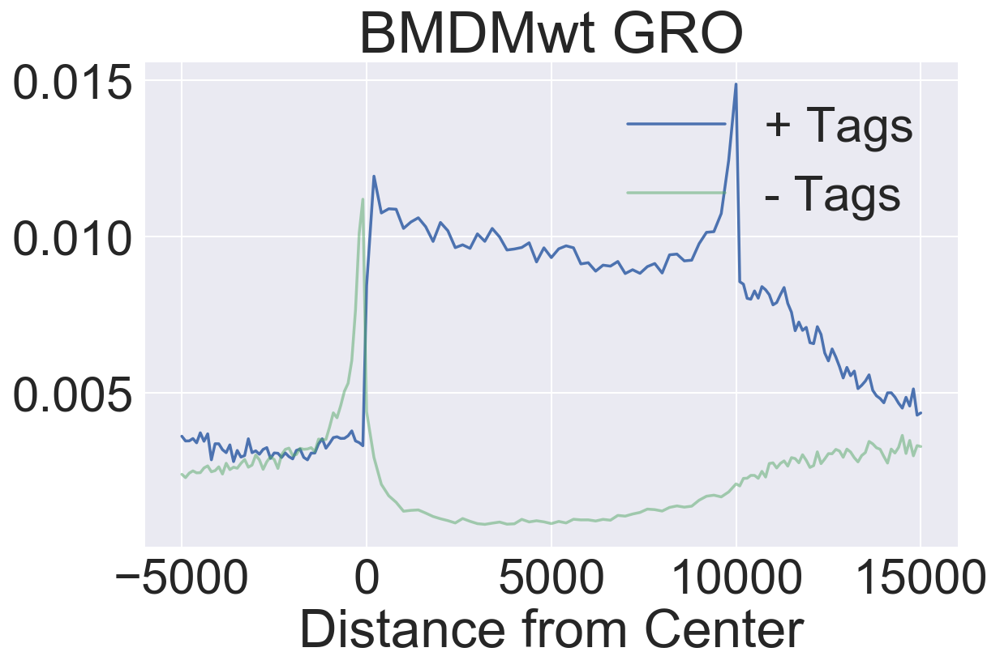

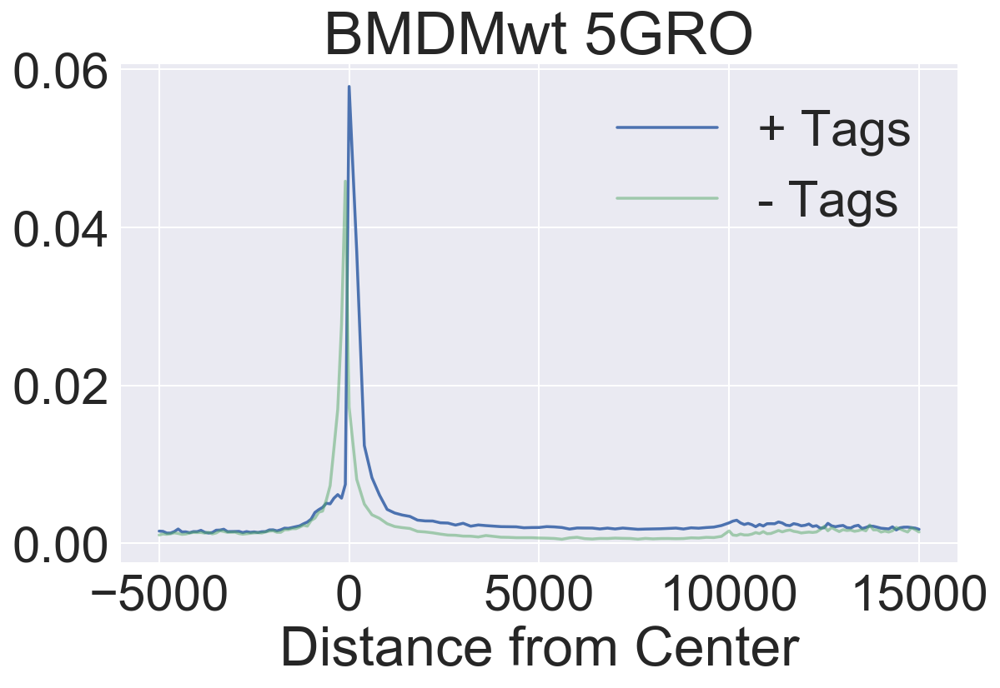

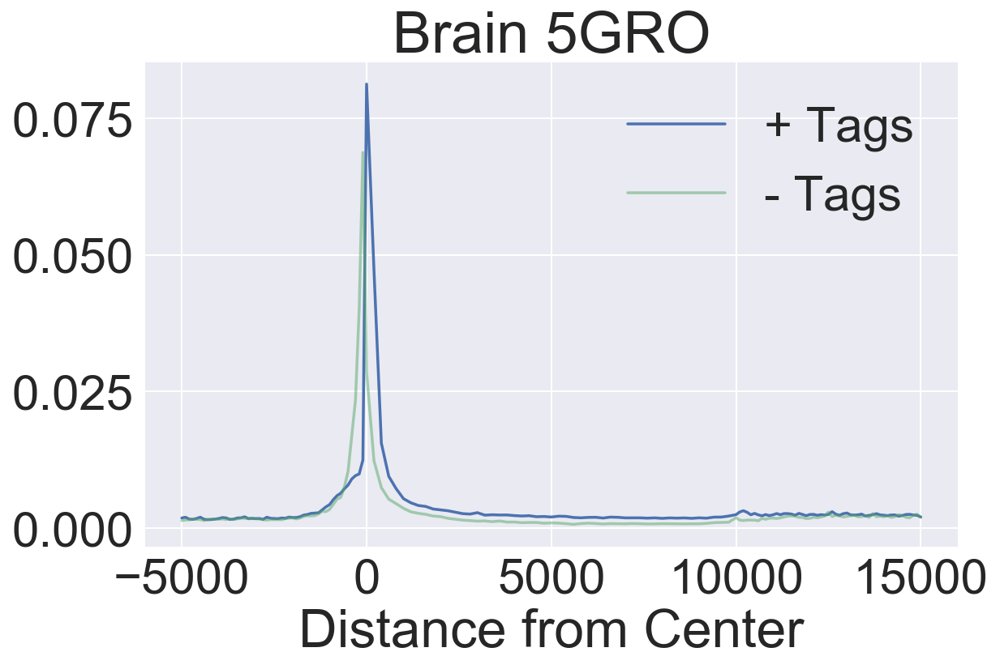

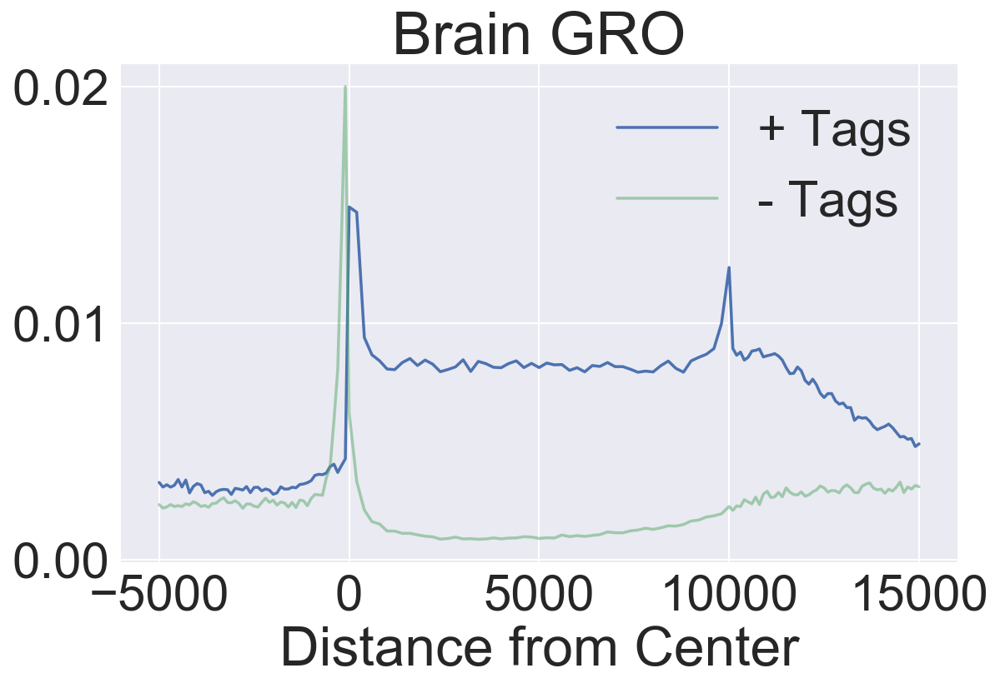

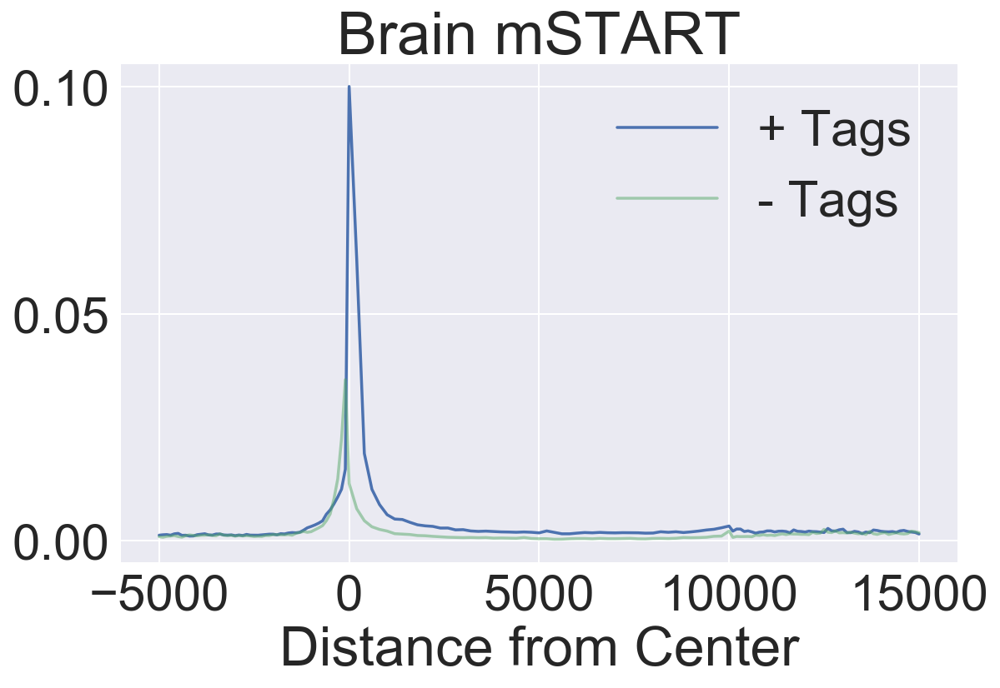

...

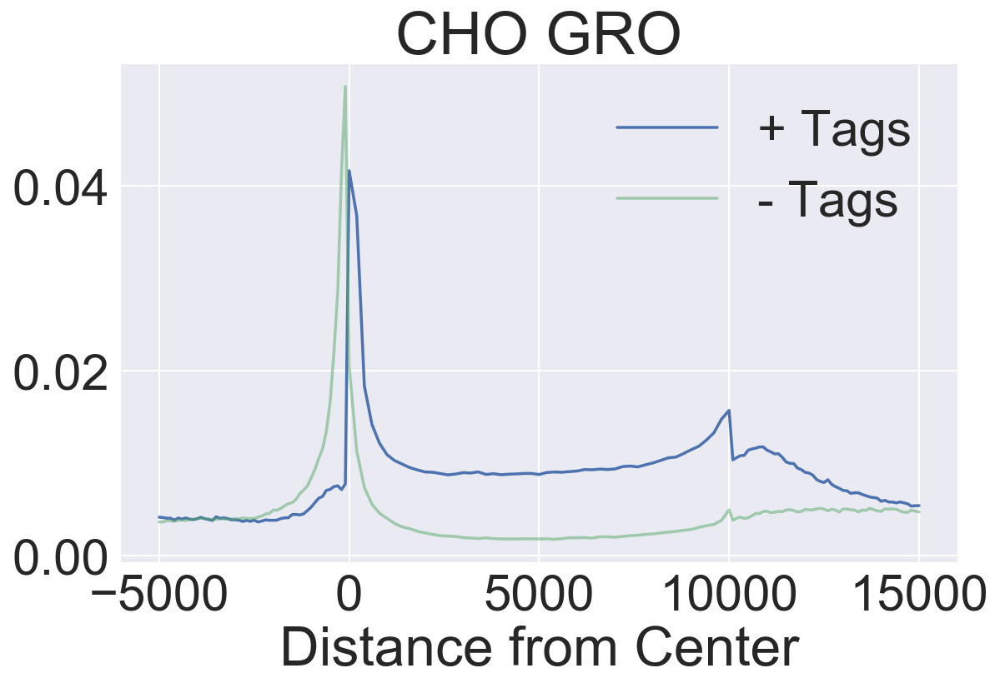

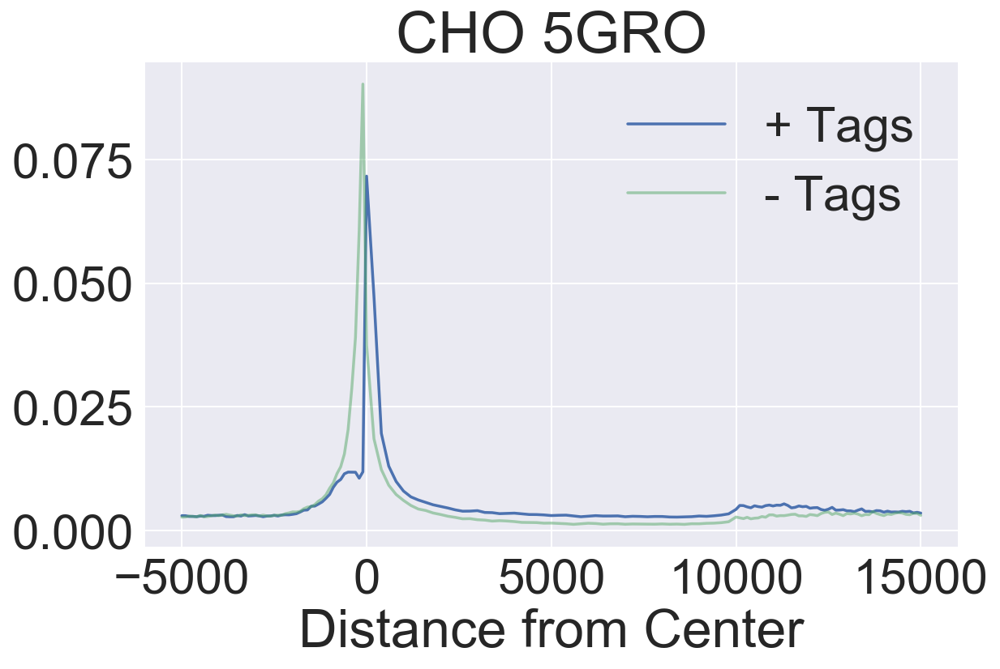

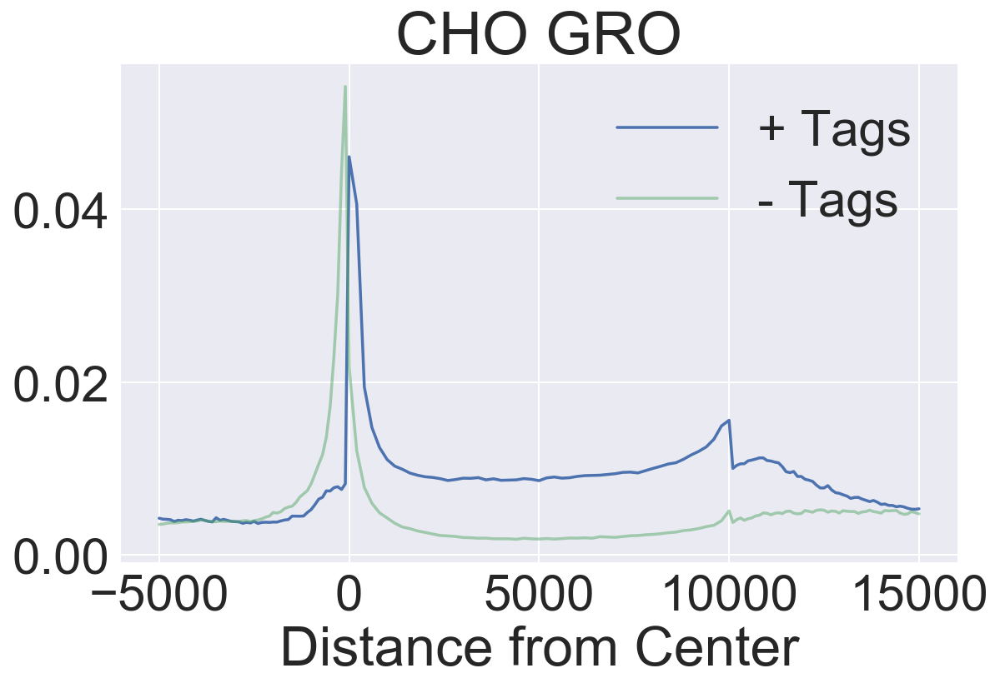

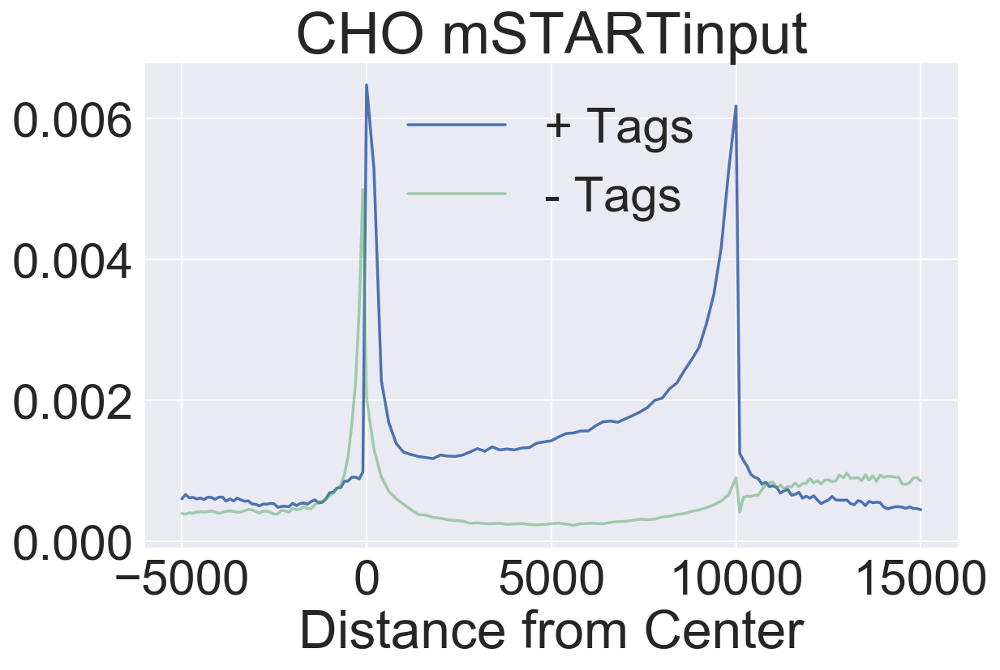

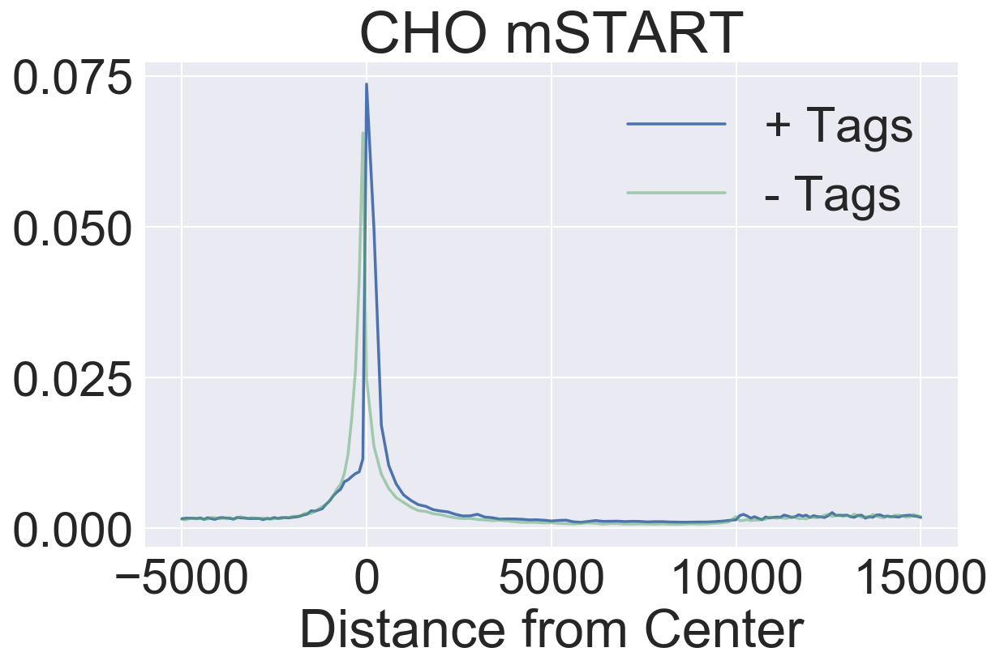

In [165]:
for t in tissues:    
    out_dir = os.path.join(save_dir, t)

    for s in ['GRO', 'mSTART']:
        curr = (os.path.join(data_folder, t, s,'f03_tags'))
        for f in glob.glob(curr + '/*'):
            in_file = f

            out_file = os.path.join(out_dir, os.path.basename(f).replace('trim_','').partition('_SD')[0])

            
            metagene = pd.read_csv(out_file,sep='\t')
            cols = metagene.columns
            cols = ['Distance from Center','Coverage','+ Tags','- Tags']
            metagene.columns = cols
            f = plt.figure()
            ax = metagene.plot('Distance from Center' ,'+ Tags')
            metagene.plot('Distance from Center','- Tags',ax=ax,alpha=0.5)
            
            if s == 'mSTART' and 'input' in os.path.basename(out_file):
                plt.title(t + ' mSTARTinput')
                
            elif s == 'GRO' and '5GRO' in os.path.basename(out_file):
                plt.title(t + ' 5GRO')
            else:
                plt.title(t + ' ' + s)
            plt.savefig(out_file + '.png')

## Make results as heatmap for pos,neg

In [166]:
save_dir = 'Results/metaGene'
org = 'ch'
gene_set = '/data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv'

metagene_full = pd.DataFrame()

for s in ['GRO', 'mSTART']:
    for t in tissues:    
        out_dir = os.path.join(save_dir, t)


        curr = (os.path.join(data_folder, t, s,'f03_tags'))
        for f in glob.glob(curr + '/*'):
            in_file = f

            out_file = os.path.join(out_dir, os.path.basename(f).replace('trim_','').partition('_SD')[0])

            print(out_file)
            
            metagene = pd.read_csv(out_file,sep='\t',index_col = 0)
            cols = metagene.columns
            
            
            if '5GRO' in out_file:
                nm =  '5GRO ' + t
            elif 'mSTARTinput' in out_file:
                nm = 'START input ' + t
            elif 'mSTART' in out_file:
                nm ='START '+ t
            else:
                nm = 'GRO ' + t
            cols = ['Coverage',nm,'- Tags']
            metagene.columns = cols
            

            metagene_full = pd.concat((metagene_full,pd.DataFrame(metagene[nm])),axis=1)

metagene_full = metagene_full.sort_index(axis=1)
metagene_full = metagene_full[~metagene_full.isnull().any(axis=1)] #Some null columns come up

Results/metaGene/BMDMwt/CHBMDMwt_GRO_JHS1026
Results/metaGene/BMDMwt/CHBMDMwt_5GRO_JHS1033
Results/metaGene/Brain/CHBrain_5GRO_JHS1036
Results/metaGene/Brain/CHBrain_GRO_JHS1029
Results/metaGene/Kidney/CHKidney_5GRO_JHS1035
Results/metaGene/Kidney/CHKidney_GRO_JHS1028
Results/metaGene/Liver/CHLiver_5GRO_JHS1038
Results/metaGene/Liver/CHLiver_GRO_JHS1031
Results/metaGene/Lung/CHLung_GRO_JHS1030
Results/metaGene/Lung/CHLung_5GRO_JHS1037
Results/metaGene/Spleen/CHBloondnegSpleen_GRO_JHS1032
Results/metaGene/Spleen/CHBloondnegSpleen_5GRO_JHS1039
Results/metaGene/CHO/CHO-5GRO-SD367_S6_R1_001.fastq
Results/metaGene/CHO/CHO-GRO-SD370_S9_R1_001.fastq
Results/metaGene/CHO/CHO-5GRO-SD371_S10_R1_001.fastq
Results/metaGene/CHO/CHO-GRO-SD369_S8_R1_001.fastq
Results/metaGene/Brain/CHBrain_mSTART_JHS1016
Results/metaGene/Brain/CHBrain_mSTARTinput_JHS1078
Results/metaGene/Brain/CHBrain_mSTART_JHS1057
Results/metaGene/Heart/CHHeart_mSTARTinput_JHS1077
Results/metaGene/Heart/CHHeart_mSTART_JHS1013
Resul

In [167]:
sns.set(font_scale=3)

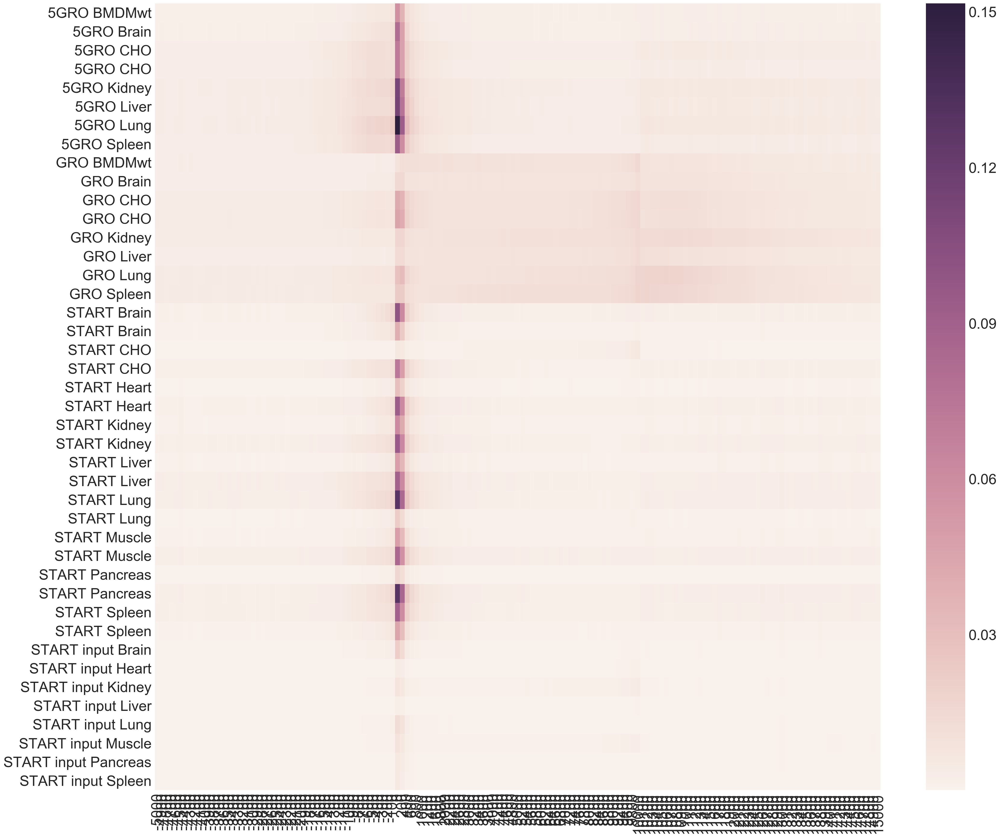

In [168]:
plt.figure(figsize=(30,30))
sns.heatmap(metagene_full.transpose())

In [169]:
normalized_metagene_full=(metagene_full-metagene_full.min())/(metagene_full.max()-metagene_full.min())

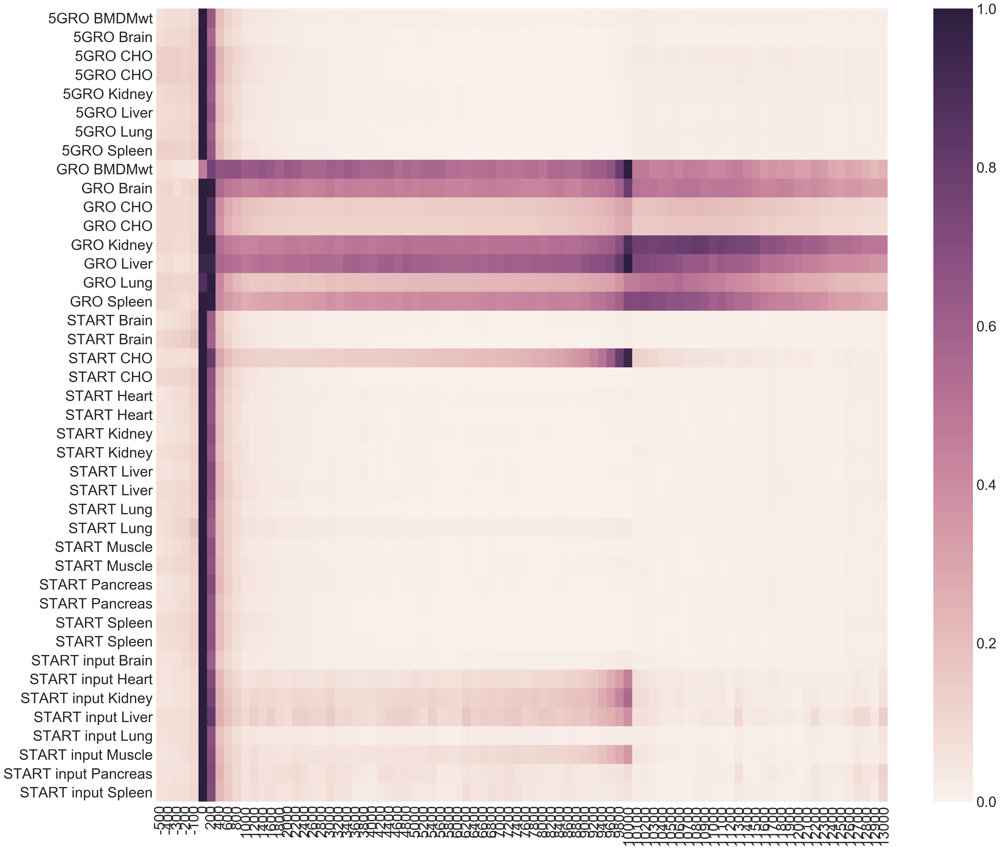

In [170]:
plt.figure(figsize=(30,30))
sns.heatmap(normalized_metagene_full.iloc[45:-20].transpose())

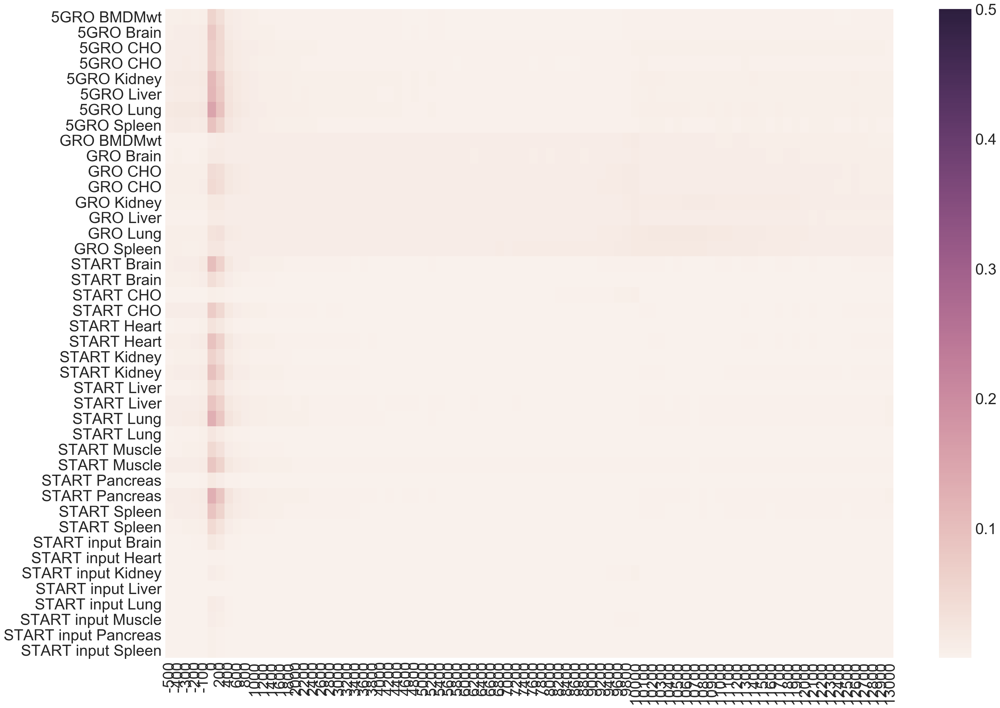

In [171]:
plt.figure(figsize=(30,20))
sns.heatmap(metagene_full.iloc[45:-20].transpose(),vmax=0.5)
plt.tight_layout()
plt.savefig('Results/metaGene/metaGene_all.png')

## Instead of tags use peaks

In [7]:
def run_metaGene_peaks(t,save_dir,org,gene_set,annotation,data_folder):

    for t in tissues:    
        #(save_dir,org,gene_set,annotation,data_folder) = (f_args)

        out_dir = os.path.join(save_dir, t)
        if not os.path.exists(out_dir):
            os.mkdir(out_dir)
        for s in ['GRO', 'mSTART']:
            f = (os.path.join(data_folder, t, s,'f04_peaks','merge_bg_2.peak'))
            print(f)
            if os.path.exists(f):
                in_file = f

                out_file = os.path.join(out_dir, os.path.basename(f).replace('trim_','').partition('_SD')[0])

                cmd = 'makeMetaGeneProfile.pl %s %s -gff3 %s -p %s -min 200 > %s' % (
                    gene_set, org, annotation, in_file, out_file)

                print(cmd)
                !{cmd}

    return 

In [8]:
save_dir = 'Results/metaGenePeaks'
if not os.path.exists(save_dir):
    os.mkdir(save_dir)
org = 'ch'
gene_set = '/data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv'
pf.parallel_ar(np.array(tissues),run_metaGene_peaks,func_args=(save_dir,org,gene_set,annotation,data_folder))

../Processed/BMDM1hKLA1/GRO/f04_peaks/merge_bg_2.peak
../Processed/BMDM1hKLA1/GRO/f04_peaks/merge_bg_2.peak
../Processed/BMDM1hKLA1/GRO/f04_peaks/merge_bg_2.peak
../Processed/BMDM1hKLA1/GRO/f04_peaks/merge_bg_2.peak
../Processed/BMDM1hKLA1/mSTART/f04_peaks/merge_bg_2.peak
../Processed/BMDM1hKLA1/mSTART/f04_peaks/merge_bg_2.peak
../Processed/BMDM1hKLA1/mSTART/f04_peaks/merge_bg_2.peak
../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak
../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak
../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/BMDMwt/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak -min 200 > 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with 


	Peak file = 0.0479577258965982.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak

	Peak file = 0.431163710382865.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		R


	Peak file = 0.942721475455077.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Brain/GRO/f04_peaks/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Resizing peaks...
	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/Brain/merge_bg_2.peak
../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/Brain/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Reading Positions...
	Reading Positions...
	-----------------------
	Finding nearby peaks in ../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak
	Reading Positions...
	-----------------------
	Finding nearby peaks in ../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BE


	Peak file = 0.868087950236262.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizin

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header 


	Peak file = 0.299551337565394.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Heart/mSTART/f04_peaks/merge_bg_2.peak
	Resizing peaks...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:


../Processed/Intestine/mSTART/f04_peaks/merge_bg_2.peak
../Processed/Kidney/GRO/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Kidney/GRO/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/Kidney/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (


	Peak file = 0.607748771625669.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Kidney/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Reading Positions...
	Reading Positions...
	-----------------------
	Finding nearby peaks in ../Processed/Kidney/GRO/f0

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Resizing peaks...
	Resizing peaks...

	Peak file = 0.607748771625669.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	----------------------------------------


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 

	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Resizing peaks...

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	Reading Positions...
	Reading Positions...
	-----------------------
	Finding nearby peaks in ../Processed/Kidney/mSTART/f04_peaks/merge_bg_2.peak
	-----------------------
	Finding nearby peaks in ../Processed/Kidney/mSTA


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
../Processed/Liver/GRO/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Liver/GRO/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/Liver/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Reading Positions...
	-----------------------
	Finding nearby peaks in ../Processed/Liver/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 50533
		Duplicated Peak IDs: 2
	-----------------------
	Finding nearby peaks in ../Processed/Liver/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 50533
		Duplicated Peak IDs: 2
	Reading Positions...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 50533
		Duplicated Peak IDs: 2
	-----------------------
	Finding nearby peaks in ../Processed/Liver/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 50533
		Duplicated Peak IDs: 2
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...



	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...
	Reading Positions...
	Reading Positions...
	Resizing peaks...
	-----------------------
	Finding nearby peaks in ../Processed/Liver/GRO/f04_peaks/merge_bg_


	Peak file = 0.753360721356334.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Liver/mSTART/f04_peaks/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File St

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 8541
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 8541
		Duplicated Peak IDs: 0
	Reading Positions...
	Reading Positions...
	-----------------------
	Finding nearby peaks in ../Processed/Liver/mSTART/f04_peaks/merge_bg_2.peak
	-----------------------
	Finding nearby peaks in ../Processed/Liver/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 8541
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 8541
		Duplicated Peak IDs: 0
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...



	Peak file = 0.509114905799837.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000



	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 


	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per % Histograms...
	Finding Tags in Peaks from each directory...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.395654517765255.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Lung/GRO/f04_peaks/merge_bg_2.peak
	Resizing peaks...

	-----------------------
	Finding nearby peaks in ../Processed/Lung/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 68485
		Duplicated Peak IDs: 6
	-----------------------
	Finding nearby peaks in ../Processed/Lung/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 68485
		Duplicated Peak IDs: 6
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 68485
		Duplicated Peak IDs: 6
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

../Processed/Lung/mSTART/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Lung/mSTART/f04_peaks/merge_bg_2.peak -min 200 > Results

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak file = 0.955109980031015.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Lung/mSTART/f04_peaks/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.197332295895652.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	---------------

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak file = 0.140691775436611.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Lung/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak/BED fi

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		R



	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!



	Peak file = 0.772565723004849.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Muscle/mSTART/f04_peaks/merge_bg_2.peak
	Resizing peaks...

	Peak file = 0.582769014247791.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 18994
		Duplicated Peak IDs: 0
	-----------------------
	Finding nearby peaks in ../Processed/Muscle/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 18994
		Duplicated Peak IDs: 0
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

../Processed/Pancreas/GRO/f04_peaks/merge_bg_2.peak
../Processed/Pancreas/mSTART/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Pancreas/mSTART/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/Pancreas/merge_bg_2.peak
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak/BED file conversion summary:
		BED/


	Peak file = 0.754024161798046.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Pancreas/mSTART/f04_peaks/merge_bg_2.peak

	Peak file = 0.363315160459937.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Pancreas/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382


	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0


	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.754024161798046.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Pancreas/mSTART/f04_peaks/merge_bg_2.peak

	Peak file = 0.554536615572037.3.tmp
	Genome = ch
	Organism = null
	Peak Region set 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 


	Peak file = 0.0855398393041504.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Spleen/GRO/f04_peaks/merge_bg_2.peak
	Resizing peaks...


	Peak file = 0.71550748527898.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Spleen/GRO/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Peak/BED file convers

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

../Processed/Spleen/mSTART/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/Spleen/mSTART/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/Spleen/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per bp Histograms...
	Finding 

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak file = 0.56740048209122.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Spleen/mSTART/f04_peaks/merge_bg_2.peak
	-----------------------
	Finding nearby peaks in ../Processed/Spleen/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Resizing peaks...

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak file = 0.307836288892762.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/Spleen/mSTART/f04_peaks/merge_bg_2.peak


	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak file = 0.570738653027551.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (b


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 



	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52228
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak file = 0.199821104602055.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/CHO/GRO/f04_peaks/merge_bg_2.peak

	Peak File Statistics:
		Total Peaks: 52228
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Resizing peaks...

	Peak file = 0.833748949299665.2.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	------------------------------------

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!


	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
../Processed/CHO/mSTART/f04_peaks/merge_bg_2.peak
makeMetaGeneProfile.pl /data/isshamie/genome/start_site_mRNA_updated_final_sort_homer.tsv ch -gff3 /data/isshamie/genome/updated_final_sort.gff3 -p ../Processed/CHO/mSTART/f04_peaks/merge_bg_2.peak -min 200 > Results/metaGenePeaks/CHO/merge_bg_2.peak

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
../Processed/CHO/mSTART/f04_peaks/merge_bg_2.peak


	Peak file = 0.998507458557473.1.tmp
	Genome = ch
	Organism = null
	Using actual sizes of regions
	Peak Region set to given
	-----------------------------------------------------
	Histogram mode activated (bin size = 1/50)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/isshamie/genome/updated_final_sort.gff3 (better to get GTF file)
	Peak Files:
		../Processed/CHO/mSTART/f04_peaks/merge_bg_2.peak
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0

	Peak File Statistics:
		Total Peaks: 52382
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52382
		Duplicated Peak IDs: 0
	Peak/BED file c

	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Compiling per bp Histograms...
	Finding Tags in Peaks from each directory...
	Peak/BED file conversion summary:
		BED/Header formatted lines: 0
		peakfile formatted lines: 52229
		Duplicated Peak IDs: 0
	Reading Positions...

	Peak File Statistics:
		Total Peaks: 52229
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!



	Resizing peaks...
	-----------------------
	Finding nearby peaks in ../Processed/CHO/mSTART/f04_peaks/merge_bg_2.peak

	Peak file = 0.256741646285267.3.tmp
	Genome = ch
	Organism = null
	Peak Region set to 10000
	-----------------------------------------------------
	Histogram mode activated (bin size = 100 bp)
	-----------------------------------------------------
	Custom annotation GFF3 file: /data/is

../Processed/BMDM1hKLA1/GRO/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/BMDM1hKLA1/merge_bg_2.peak
../Processed/BMDM1hKLA1/mSTART/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/BMDM1hKLA1/merge_bg_2.peak
../Processed/BMDMwt/GRO/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/BMDMwt/merge_bg_2.peak
../Processed/BMDMwt/mSTART/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/BMDMwt/merge_bg_2.peak
../Processed/Brain/GRO/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/Brain/merge_bg_2.peak
../Processed/Brain/mSTART/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/Brain/merge_bg_2.peak
../Processed/FemaleReproductive/GRO/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/FemaleReproductive/merge_bg_2.peak
../Processed/FemaleReproductive/mSTART/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/FemaleReproductive/merge_bg_2.peak
../Processed/Heart/GRO/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/Heart/merge_bg_2.peak
../Processed/Heart/mSTART/f04_peaks/merge_bg_2.peak
Results/metaGenePeaks/H

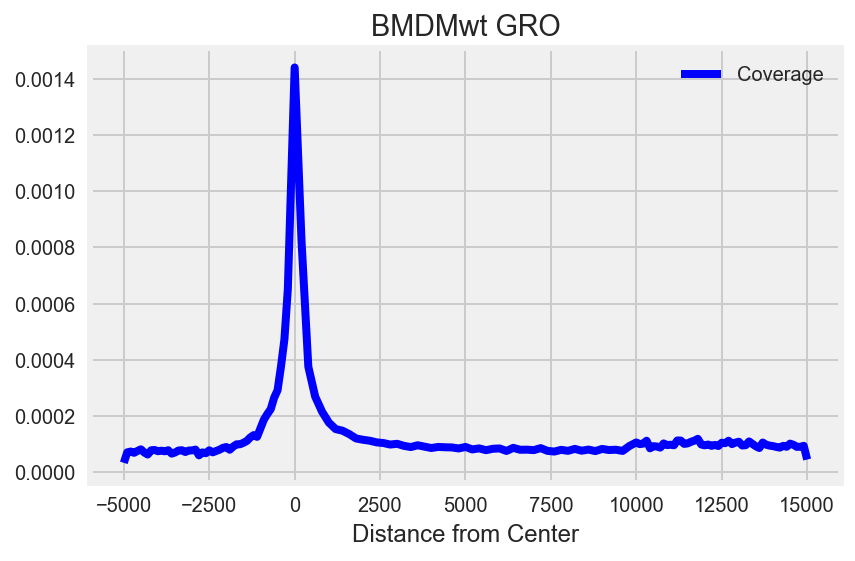

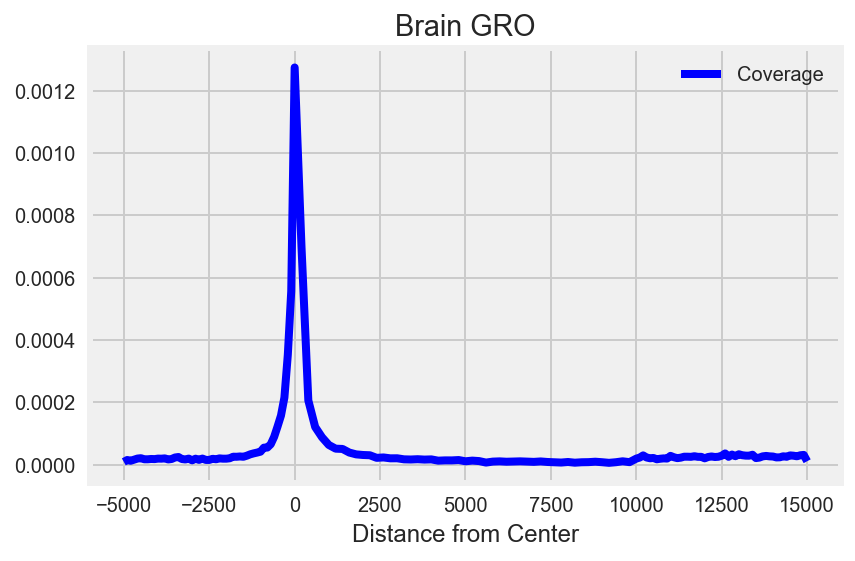

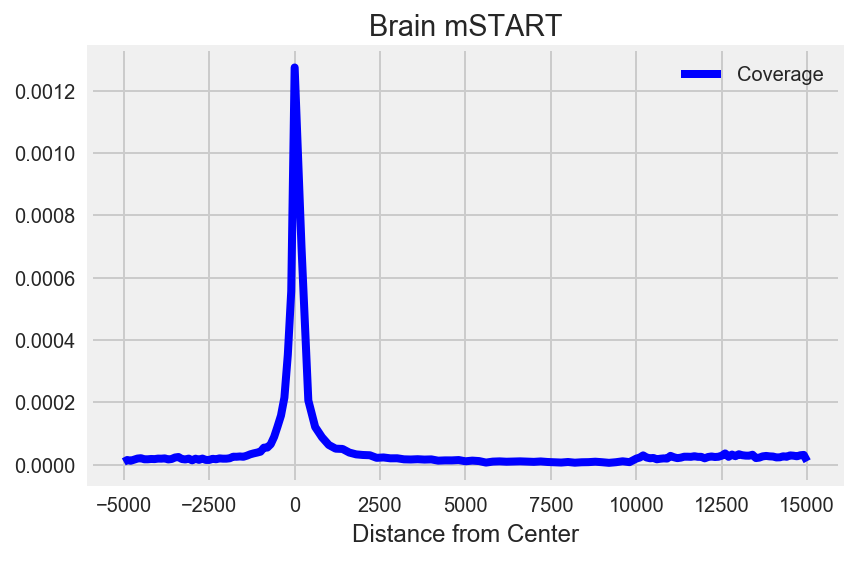

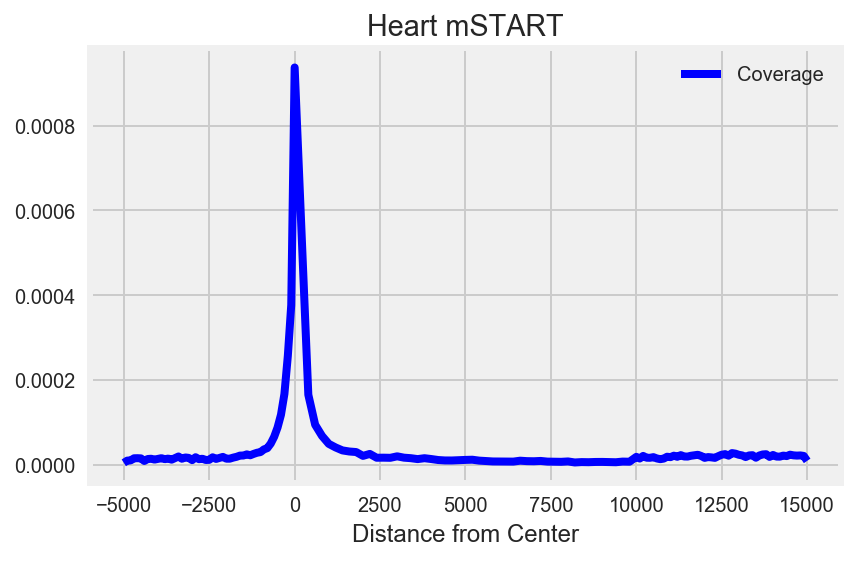

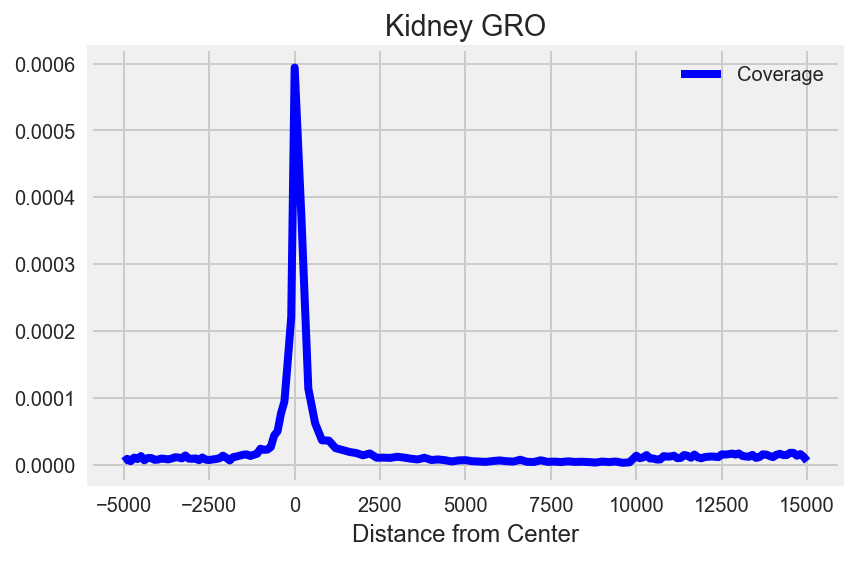

...

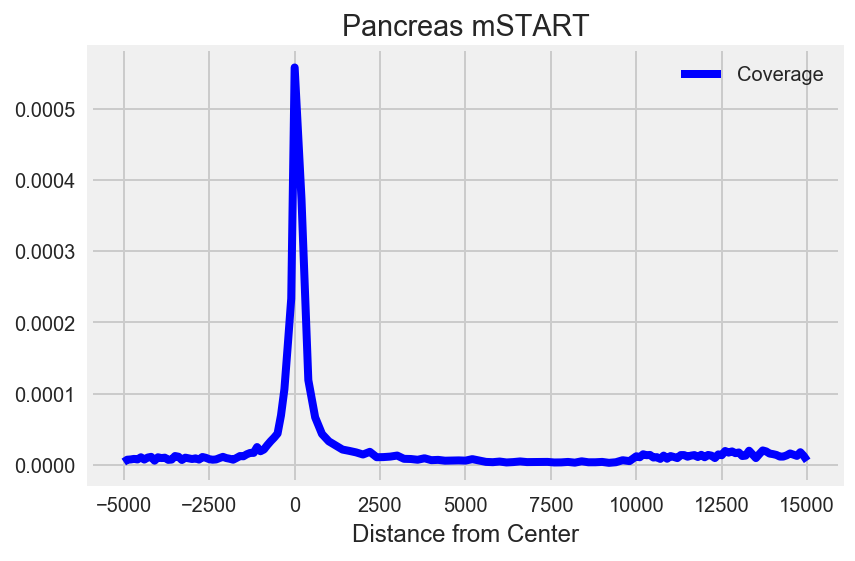

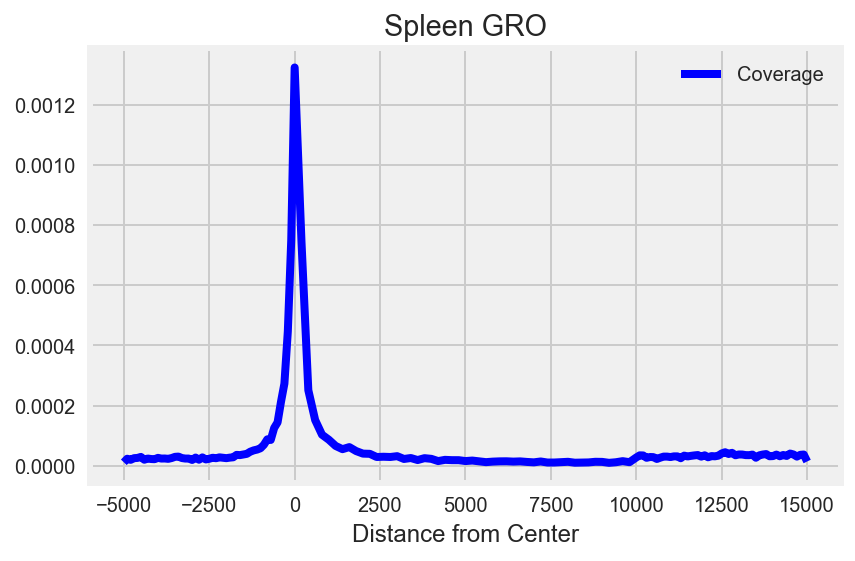

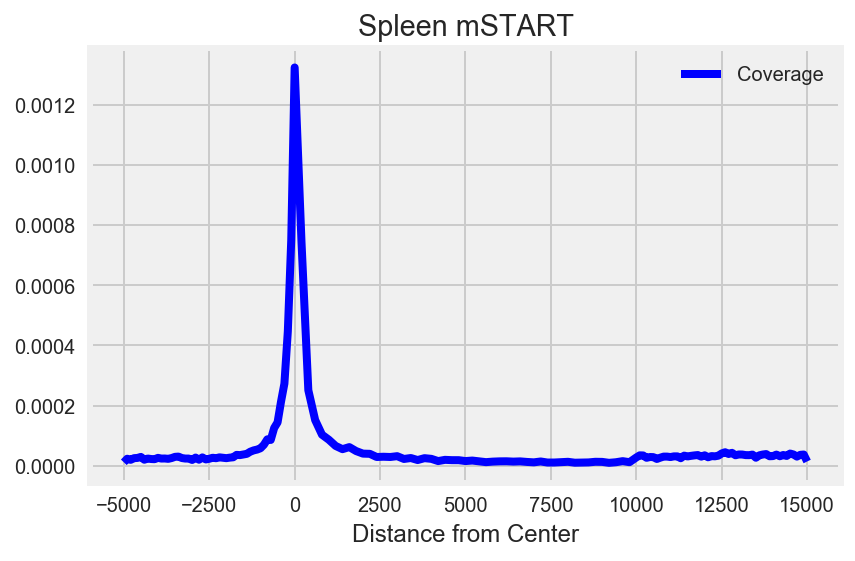

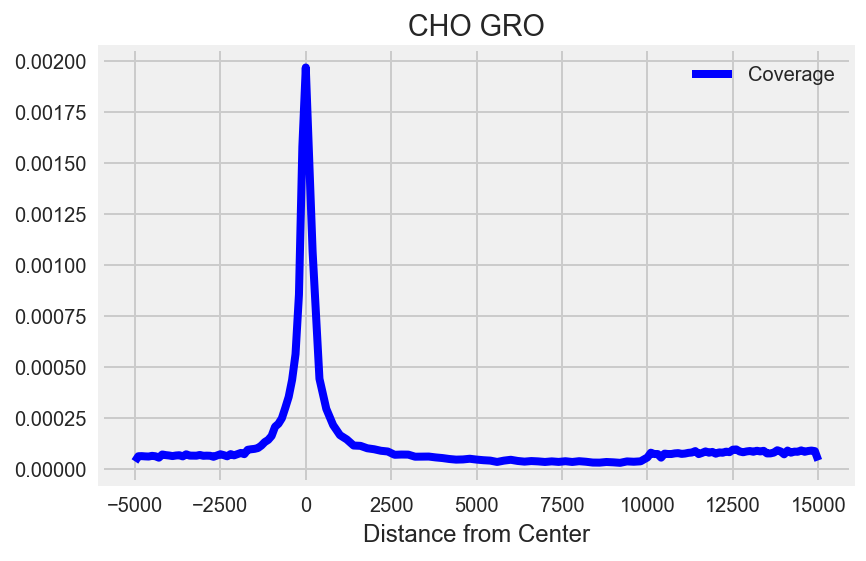

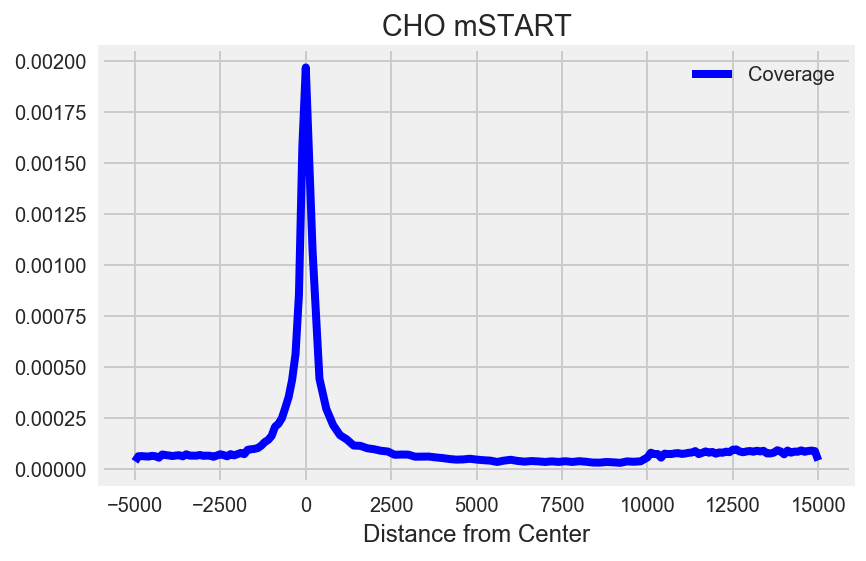

In [18]:
for t in tissues:    
    out_dir = os.path.join(save_dir, t)

    for s in ['GRO', 'mSTART']:
        f = (os.path.join(data_folder, t, s,'f04_peaks','merge_bg_2.peak'))
        in_file = f
        out_file = os.path.join(out_dir, os.path.basename(f))
        print(in_file)
        print(out_file)
        if os.path.exists(f) and os.path.exists(out_file):
            metagene = pd.read_csv(out_file,sep='\t')
            cols = metagene.columns
            cols = ['Distance from Center','Coverage']#,'+ Tags','- Tags']
            metagene.columns = cols
            
            
            f = plt.figure()
            ax = metagene.plot('Distance from Center' ,'Coverage')

            if s == 'mSTART' and 'input' in os.path.basename(out_file):
                plt.title(t + ' mSTARTinput')

            elif s == 'GRO' and '5GRO' in os.path.basename(out_file):
                plt.title(t + ' 5GRO')
            else:
                plt.title(t + ' ' + s)
            plt.savefig(out_file + '.png')